# Dependencies

In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [3]:
import itertools
import logging
import os
import pickle
import pprint
from glob import glob
os.chdir(os.path.expandvars('$HOME/sleep-staging'))

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import phate
import scprep
import seaborn as sns
import umap
import umap.plot
from h5py import File
from tqdm.notebook import tqdm

sns.set(context='paper', rc={'figure.figsize':(11,10)})

HYP_DICT = {0: 'W', 1: 'N1', 2: 'N2', 3: 'N3', 4: 'R'}
logging.basicConfig(format='%(asctime)s %(levelname)s | %(message)s', level=logging.INFO, datefmt='%I:%M:%S')
logger = logging.getLogger()

In [5]:
df = pd.read_csv('overview_file_cohortsEM-ling1.csv')
display(df.head())

,Index,ID,ID-ling,Cohort,Diagnosis,Label,Sleep scoring training data,Sleep scoring test data,Narcolepsy training data,Narcolepsy test data,Replication data,High pre-test,CSF hypocretin-1,DQ0602,Added by Alex
0,NaN,SSC_NARCO_1508_1,1508,SSC,'T1 NARCOLEPSY',1,0,1,1,0,0,1,na,1,1
1,NaN,SSC_NARCO_1534_1,1534,SSC,'T1 NARCOLEPSY',1,0,1,1,0,0,1,na,1,1
2,NaN,SSC_NARCO_1538_1,1538,SSC,'T1 NARCOLEPSY',1,0,1,0,1,0,1,na,1,1
3,NaN,SSC_NARCO_1647_1,1647,SSC,'T1 NARCOLEPSY',1,0,1,1,0,0,1,na,1,1
4,1267.0,SSC_1958_1,1958,SSC,'T1 NARCOLEPSY',1,0,1,1,0,0,1,0,0,0


In [4]:
available_predictions = glob("experiments/**/SSC-WSC_test_predictions.pkl", recursive=True)
pprint.pprint(available_predictions)

['experiments/massc/avg_kw21/20201126_043826/SSC-WSC_test_predictions.pkl',
 'experiments/massc/avg_kw21_rnn128/20201209_025443/SSC-WSC_test_predictions.pkl',
 'experiments/massc/att30/20201124_080609/SSC-WSC_test_predictions.pkl',
 'experiments/massc/avg_kw21_rnn128_cyclic/20201212_150902/SSC-WSC_test_predictions.pkl']


In [6]:
selected_experiment = 'experiments/massc/avg_kw21/20201126_043826/SSC-WSC_test_predictions.pkl'
with open(selected_experiment, 'rb') as f:
    predictions = pickle.load(f)
list_studies = list(predictions.keys())
df_preds = pd.read_csv(os.path.join(os.path.dirname(selected_experiment), 'SSC-WSC_test_results.csv'), index_col=0)
df_preds = pd.merge(left=df_preds, right=df[['ID', 'Diagnosis', 'Label']], how='left', right_on='ID', left_on='SubjectID')
display(df_preds.query('Label == 0').sort_values('Balanced accuracy', ascending=False))
print(f"Unique classes: {df_preds['Diagnosis'].unique()}")
print(f"Window unique classes: {df_preds['Window'].unique()}")
print(f"Case unique classes: {df_preds['Case'].unique()}")
display(df_preds.query('Label == 1'))

,FileID,SubjectID,Window,Case,Accuracy,Balanced accuracy,Kappa,F1,Precision,Recall,...,Precision - N3,Recall - N3,Support - N3,F1 - REM,Precision - REM,Recall - REM,Support - REM,ID,Diagnosis,Label
52,A1038_4 172720.h5,A1038_4 172720,1 s,all,0.849057,0.894873,0.795451,0.830931,0.806470,0.894873,...,0.548148,0.986667,75.0,0.985782,0.971963,1.000000,104.0,A1038_4 172720,'NON-NARCOLEPSY CONTROL',0
508,SSC_6856_1.h5,SSC_6856_1,1 s,all,0.876377,0.892037,0.811801,0.784684,0.733296,0.892037,...,0.480519,1.000000,37.0,0.880000,0.785714,1.000000,33.0,SSC_6856_1,'NON-NARCOLEPSY CONTROL',0
150,C1040_4 181859.h5,C1040_4 181859,1 s,all,0.883333,0.888253,0.817163,0.776490,0.769768,0.888253,...,0.842593,0.900990,101.0,0.973294,0.959064,0.987952,166.0,C1040_4 181859,'NON-NARCOLEPSY CONTROL',0
507,SSC_6854_1.h5,SSC_6854_1,1 s,all,0.831891,0.884168,0.776560,0.818131,0.812352,0.884168,...,0.847134,1.000000,133.0,0.921348,0.901099,0.942529,87.0,SSC_6854_1,'NON-NARCOLEPSY CONTROL',0
220,C9145_2 172540.h5,C9145_2 172540,1 s,all,0.840263,0.883908,0.773819,0.750679,0.725847,0.883908,...,0.407407,1.000000,55.0,0.945736,0.978610,0.915000,200.0,C9145_2 172540,'NON-NARCOLEPSY CONTROL',0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396,SSC_5280_1.h5,SSC_5280_1,1 s,all,0.474593,0.530022,0.314027,0.395287,0.529237,0.530022,...,0.940476,0.763285,207.0,0.145631,0.078534,1.000000,15.0,SSC_5280_1,'NON-NARCOLEPSY CONTROL',0
514,SSC_6927_1.h5,SSC_6927_1,1 s,all,0.745384,0.509478,0.571534,0.427622,0.547962,0.407582,...,0.000000,0.000000,0.0,0.907104,0.861592,0.957692,260.0,SSC_6927_1,'NON-NARCOLEPSY CONTROL',0
120,C0605_4 173848.h5,C0605_4 173848,1 s,all,0.544211,0.508400,0.353138,0.490093,0.615286,0.508400,...,0.000000,0.000000,0.0,0.500000,0.774194,0.369231,65.0,C0605_4 173848,'NON-NARCOLEPSY CONTROL',0
411,SSC_5458_1.h5,SSC_5458_1,1 s,all,0.581797,0.489882,0.341106,0.294390,0.314674,0.293929,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,SSC_5458_1,'NON-NARCOLEPSY CONTROL',0


Unique classes: ["'NON-NARCOLEPSY CONTROL'" "'T1 NARCOLEPSY'" "'OTHER HYPERSOMNIA'"]
Window unique classes: ['1 s']
Case unique classes: ['all']


,FileID,SubjectID,Window,Case,Accuracy,Balanced accuracy,Kappa,F1,Precision,Recall,...,Precision - N3,Recall - N3,Support - N3,F1 - REM,Precision - REM,Recall - REM,Support - REM,ID,Diagnosis,Label
299,SSC_1958_1.h5,SSC_1958_1,1 s,all,0.656039,0.700787,0.480362,0.477659,0.486116,0.700787,...,0.292453,0.756098,41.0,0.470588,0.307692,1.000000,16.0,SSC_1958_1,'T1 NARCOLEPSY',1
300,SSC_2605_1.h5,SSC_2605_1,1 s,all,0.681190,0.622985,0.568261,0.466644,0.542127,0.622985,...,0.843836,0.950617,324.0,0.023810,0.012048,1.000000,1.0,SSC_2605_1,'T1 NARCOLEPSY',1
306,SSC_4723_1.h5,SSC_4723_1,1 s,all,0.662694,0.680094,0.549286,0.599497,0.615273,0.680094,...,0.994536,0.719368,253.0,0.896175,0.828283,0.976190,168.0,SSC_4723_1,'T1 NARCOLEPSY',1
315,SSC_4813_1.h5,SSC_4813_1,1 s,all,0.735939,0.597847,0.644742,0.610992,0.633843,0.597847,...,0.000000,0.000000,5.0,0.859756,0.933775,0.796610,177.0,SSC_4813_1,'T1 NARCOLEPSY',1
355,SSC_5139_1.h5,SSC_5139_1,1 s,all,0.649302,0.714275,0.498503,0.585201,0.617166,0.714275,...,0.447619,0.921569,51.0,0.836449,0.736626,0.967568,185.0,SSC_5139_1,'T1 NARCOLEPSY',1
397,SSC_5335_1.h5,SSC_5335_1,1 s,all,0.752821,0.768032,0.678440,0.734077,0.737968,0.768032,...,0.795181,0.985075,134.0,0.759322,0.666667,0.881890,127.0,SSC_5335_1,'T1 NARCOLEPSY',1
499,SSC_6542_1.h5,SSC_6542_1,1 s,all,0.821542,0.879353,0.745264,0.708109,0.721268,0.879353,...,0.920863,0.955224,134.0,0.883168,0.854406,0.913934,244.0,SSC_6542_1,'T1 NARCOLEPSY',1


In [6]:
# get dataframe sorted by life Expectancy in each continent 
g = df_preds.groupby(["Diagnosis"]).apply(lambda x: x.sort_values(["Accuracy"], ascending = False)).reset_index(drop=True)
# select top N rows within each continent
selected_top10 = g.groupby('Diagnosis').head(10).reset_index(drop=True)

In [7]:
top10_controls = df_preds[
    (df_preds['Label'] == 0)
    & (df_preds['Support - W'] > 20) 
    & (df_preds['Support - N1'] > 20) 
    & (df_preds['Support - N2'] > 20) 
    & (df_preds['Support - N3'] > 20) 
    & (df_preds["Support - REM"] > 20)
].sort_values(["Accuracy"], ascending=False).head(8).reset_index(drop=True)
display(top10_controls)

,FileID,SubjectID,Window,Case,Accuracy,Balanced accuracy,Kappa,F1,Precision,Recall,...,Precision - N3,Recall - N3,Support - N3,F1 - REM,Precision - REM,Recall - REM,Support - REM,ID,Diagnosis,Label
0,C1584_3 172654.h5,C1584_3 172654,1 s,all,0.912027,0.815213,0.865526,0.784308,0.761220,0.815213,...,0.485714,0.586207,29.0,0.896175,0.872340,0.921348,89.0,C1584_3 172654,'NON-NARCOLEPSY CONTROL',0
1,A2202_3 171828.h5,A2202_3 171828,1 s,all,0.908976,0.836763,0.793684,0.777232,0.766219,0.836763,...,0.705128,1.000000,55.0,0.805970,0.692308,0.964286,28.0,A2202_3 171828,'NON-NARCOLEPSY CONTROL',0
2,A0147_6 165655.h5,A0147_6 165655,1 s,all,0.900966,0.871082,0.842300,0.800551,0.769639,0.871082,...,0.597015,0.851064,47.0,0.938462,0.945736,0.931298,131.0,A0147_6 165655,'NON-NARCOLEPSY CONTROL',0
3,SSC_5547_1.h5,SSC_5547_1,1 s,all,0.899548,0.877883,0.848494,0.850218,0.828665,0.877883,...,0.808383,0.957447,141.0,0.951220,0.917647,0.987342,158.0,SSC_5547_1,'NON-NARCOLEPSY CONTROL',0
4,N4499_2 092211.h5,N4499_2 092211,1 s,all,0.890519,0.819924,0.828192,0.785691,0.766977,0.819924,...,0.702381,0.855072,69.0,0.953930,0.926316,0.983240,179.0,N4499_2 092211,'NON-NARCOLEPSY CONTROL',0
5,A0531_6 175138.h5,A0531_6 175138,1 s,all,0.888331,0.871765,0.843528,0.832315,0.819650,0.871765,...,0.758065,0.824561,57.0,0.928910,0.980000,0.882883,111.0,A0531_6 175138,'NON-NARCOLEPSY CONTROL',0
6,C2209_4 233629.h5,C2209_4 233629,1 s,all,0.888122,0.854197,0.844454,0.833848,0.834242,0.854197,...,0.915254,0.739726,73.0,0.960396,0.960396,0.960396,101.0,C2209_4 233629,'NON-NARCOLEPSY CONTROL',0
7,A1558_4 172739.h5,A1558_4 172739,1 s,all,0.885822,0.711440,0.728961,0.716749,0.761310,0.711440,...,0.727273,0.355556,45.0,0.859259,0.816901,0.906250,64.0,A1558_4 172739,'NON-NARCOLEPSY CONTROL',0


In [8]:
narcs = df_preds[
    (df_preds['Label'] == 1)
].sort_values(["Accuracy"], ascending=False).reset_index(drop=True)
display(narcs)

,FileID,SubjectID,Window,Case,Accuracy,Balanced accuracy,Kappa,F1,Precision,Recall,...,Precision - N3,Recall - N3,Support - N3,F1 - REM,Precision - REM,Recall - REM,Support - REM,ID,Diagnosis,Label
0,SSC_6542_1.h5,SSC_6542_1,1 s,all,0.821542,0.879353,0.745264,0.708109,0.721268,0.879353,...,0.920863,0.955224,134.0,0.883168,0.854406,0.913934,244.0,SSC_6542_1,'T1 NARCOLEPSY',1
1,SSC_5335_1.h5,SSC_5335_1,1 s,all,0.752821,0.768032,0.678440,0.734077,0.737968,0.768032,...,0.795181,0.985075,134.0,0.759322,0.666667,0.881890,127.0,SSC_5335_1,'T1 NARCOLEPSY',1
2,SSC_4813_1.h5,SSC_4813_1,1 s,all,0.735939,0.597847,0.644742,0.610992,0.633843,0.597847,...,0.000000,0.000000,5.0,0.859756,0.933775,0.796610,177.0,SSC_4813_1,'T1 NARCOLEPSY',1
3,SSC_2605_1.h5,SSC_2605_1,1 s,all,0.681190,0.622985,0.568261,0.466644,0.542127,0.622985,...,0.843836,0.950617,324.0,0.023810,0.012048,1.000000,1.0,SSC_2605_1,'T1 NARCOLEPSY',1
4,SSC_4723_1.h5,SSC_4723_1,1 s,all,0.662694,0.680094,0.549286,0.599497,0.615273,0.680094,...,0.994536,0.719368,253.0,0.896175,0.828283,0.976190,168.0,SSC_4723_1,'T1 NARCOLEPSY',1
5,SSC_1958_1.h5,SSC_1958_1,1 s,all,0.656039,0.700787,0.480362,0.477659,0.486116,0.700787,...,0.292453,0.756098,41.0,0.470588,0.307692,1.000000,16.0,SSC_1958_1,'T1 NARCOLEPSY',1
6,SSC_5139_1.h5,SSC_5139_1,1 s,all,0.649302,0.714275,0.498503,0.585201,0.617166,0.714275,...,0.447619,0.921569,51.0,0.836449,0.736626,0.967568,185.0,SSC_5139_1,'T1 NARCOLEPSY',1


# Create a control-based embedding space

Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 21.96 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 7.58 seconds.
  Calculated graph and diffusion operator in 31.13 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 38.57 seconds.
    Calculating KMeans...
    Calculated KMeans in 50.41 seconds.
  Calculated landmark operator in 94.53 seconds.
  Calculating optimal t...
    Automatically selected t = 56
  Calculated optimal t in 1.90 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.86 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.76 seconds.
Calculated PHATE in 134.19 seconds.
Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 27.13 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 5.98 seconds.
  Calculated graph and diffusion operator in 34.51 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 57.26 seconds.
    Calculating KMeans...
    Calculated KMeans in 40.21 seconds.
  Calculated landmark operator in 103.08 seconds.
  Calculating optimal t...
    Automatically selected t = 20
  Calculated optimal t in 1.66 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.62 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.63 seconds.
Calculated PHATE in 145.51 seconds.
Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 40.68 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 10.47 seconds.
  Calculated graph and diffusion operator in 52.65 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 95.14 seconds.
    Calculating KMeans...
    Calculated KMeans in 40.47 seconds.
  Calculated landmark operator in 141.31 seconds.
  Calculating optimal t...
    Automatically selected t = 22
  Calculated optimal t in 1.61 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.74 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.70 seconds.
Calculated PHATE in 202.02 seconds.
Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 64.99 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 20.60 seconds.
  Calculated graph and diffusion operator in 88.43 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 168.93 seconds.
    Calculating KMeans...
    Calculated KMeans in 48.09 seconds.
  Calculated landmark operator in 223.09 seconds.
  Calculating optimal t...
    Automatically selected t = 76
  Calculated optimal t in 1.51 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.93 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.62 seconds.
Calculated PHATE in 319.59 seconds.
Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 111.80 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 42.70 seconds.
  Calculated graph and diffusion operator in 160.46 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 313.02 seconds.
    Calculating KMeans...
    Calculated KMeans in 42.77 seconds.
  Calculated landmark operator in 362.22 seconds.
  Calculating optimal t...
    Automatically selected t = 61
  Calculated optimal t in 1.53 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.04 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.70 seconds.
Calculated PHATE in 530.98 seconds.
Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 310.67 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 490.13 seconds.
  Calculated graph and diffusion operator in 820.57 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 602.64 seconds.
    Calculating KMeans...
    Calculated KMeans in 68.56 seconds.
  Calculated landmark operator in 680.54 seconds.
  Calculating optimal t...
    Automatically selected t = 16
  Calculated optimal t in 3.54 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.59 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.88 seconds.
Calculated PHATE in 1511.20 seconds.


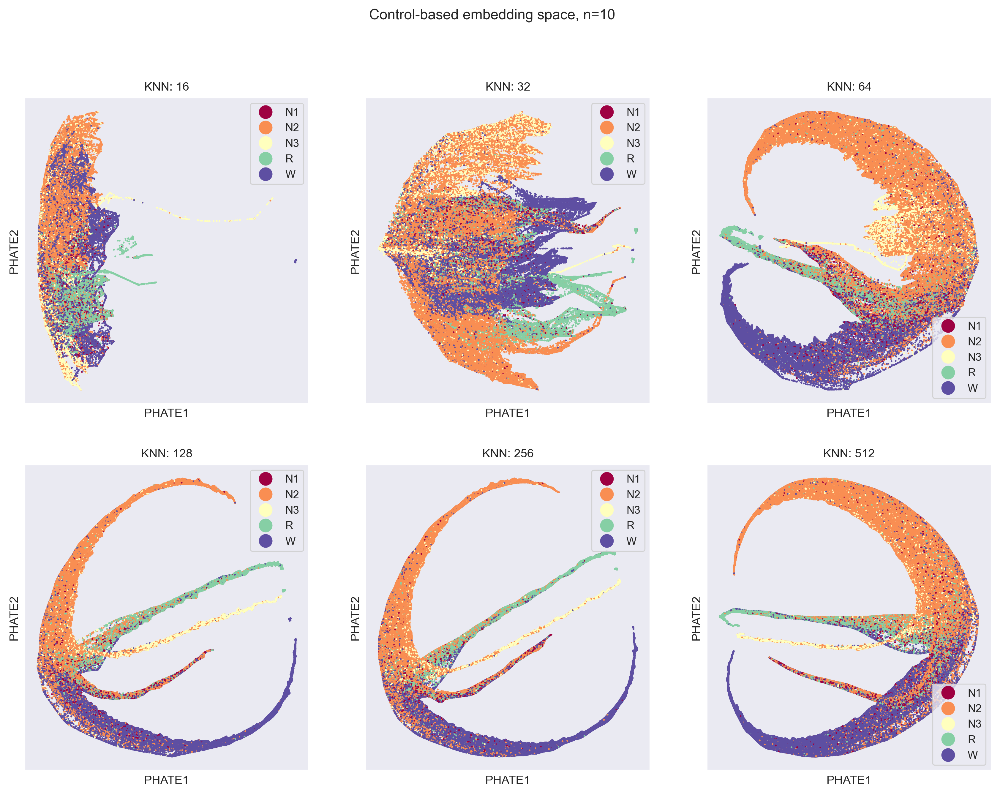

In [52]:
# Create a control-based embedding space
X = []
y = []
l = []
d = []
for idx, selected_record in top10_controls.iterrows():
    fileid = selected_record['FileID']
    diagnosis = selected_record['Diagnosis'].replace("'", "")
    record = predictions[fileid]
    logits = record['logits']
    target = record['true'].argmax(axis=1).repeat(30)
    labels = np.array([HYP_DICT[t] for t in target])
    labels_disease = [diagnosis for _ in range(len(target))]
    
    X.append(logits)
    y.append(target)
    l.append(labels)
    d.extend(labels_disease)
    
X = np.concatenate(X, axis=0)
y = np.concatenate(y, axis=0)
l = np.concatenate(l, axis=0)
f, axes = plt.subplots(nrows=2, ncols=3, dpi=300)
for i, j, n_knn in zip(
    (0, 0, 0, 1, 1, 1), 
    (0, 1, 2, 0, 1, 2), 
#     [2, 2, 2, 2, 2, 2]
    [16, 32, 64, 128, 256, 512]
#     [25, 50, 100, 150, 200, 250]
):
#     print(f"({i}, {j}): {n_knn}")
    phate_op = phate.PHATE(n_jobs=-1, random_state=1337, knn=n_knn)
    y_phate = phate_op.fit_transform(X)
    title = f"KNN: {n_knn}"
    scprep.plot.scatter2d(
        y_phate, 
#         c=d, 
        c=l,
        cmap='Spectral', 
        ticks=False, 
        label_prefix='PHATE', 
        ax=axes[i, j],
        title=title
    )
#     axes[i, j].set_title('subplot 1')
plt.suptitle(f'Control-based embedding space, n={10}')
# plt.savefig(f'results/phate_control_embedding.png', dpi=300, bbox_inches='tight', pad_inches=0)
#     break
# #     plt.savefig(f"results/phate/phate_narco_{fileid.split('.')[0]}_knn{n_knn:03}_disorder.png", dpi=300, bbox_inches='tight', pad_inches=0)
#     scprep.plot.scatter2d(y_phate, c=l, cmap='Spectral', ticks=False, label_prefix='PHATE')
#     plt.title(title)
# #     plt.savefig(f"results/phate/phate_narco_{fileid.split('.')[0]}_knn{n_knn:03}_stages.png", dpi=300, bbox_inches='tight', pad_inches=0)

Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 64.66 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 20.02 seconds.
  Calculated graph and diffusion operator in 87.22 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 166.91 seconds.
    Calculating KMeans...
    Calculated KMeans in 46.63 seconds.
  Calculated landmark operator in 219.15 seconds.
  Calculating optimal t...
    Automatically selected t = 76
  Calculated optimal t in 1.51 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.94 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.61 seconds.
Calculated PHATE in 314.46 seconds.
Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 65.67 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 19.73 seconds.
  Calculated graph and diffusion operator in 87.99 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 147.66 seconds.
    Calculating KMeans...
    Calculated KMeans in 47.05 seconds.
  Calculated landmark operator in 200.62 seconds.
  Calculating optimal t...
    Automatically selected t = 76
  Calculated optimal t in 1.54 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.07 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.66 seconds.
Calculated PHATE in 296.89 seconds.
Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 65.71 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 19.96 seconds.
  Calculated graph and diffusion operator in 88.27 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 147.20 seconds.
    Calculating KMeans...
    Calculated KMeans in 46.69 seconds.
  Calculated landmark operator in 199.83 seconds.
  Calculating optimal t...
    Automatically selected t = 76
  Calculated optimal t in 1.47 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.86 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.59 seconds.
Calculated PHATE in 296.03 seconds.
Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 64.46 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 20.02 seconds.
  Calculated graph and diffusion operator in 87.05 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 148.03 seconds.
    Calculating KMeans...
    Calculated KMeans in 46.63 seconds.
  Calculated landmark operator in 200.60 seconds.
  Calculating optimal t...
    Automatically selected t = 76
  Calculated optimal t in 1.53 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 1.06 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.60 seconds.
Calculated PHATE in 295.85 seconds.
Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 64.79 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 19.93 seconds.
  Calculated graph and diffusion operator in 87.25 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 150.01 seconds.
    Calculating KMeans...
    Calculated KMeans in 47.06 seconds.
  Calculated landmark operator in 202.95 seconds.
  Calculating optimal t...
    Automatically selected t = 76
  Calculated optimal t in 1.57 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.86 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.57 seconds.
Calculated PHATE in 298.22 seconds.


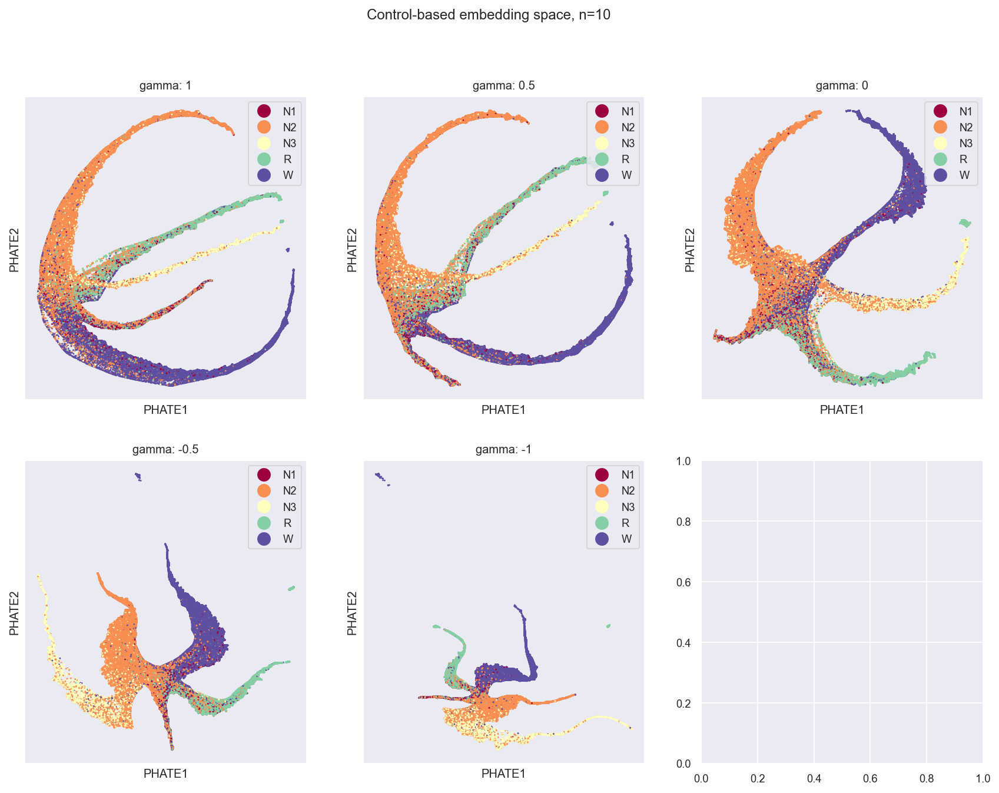

In [79]:
# Create a control-based embedding space
# f, axes = plt.subplots(nrows=2, ncols=3, dpi=300)
n_knn = 128
gamma = (1, 0.5, 0, -0.5, -1)
f, axes = plt.subplots(nrows=2, ncols=3, dpi=150)
for i, j, g in zip(
    (0, 0, 0, 1, 1),
    (0, 1, 2, 0, 1),
    gamma
):
    phate_op = phate.PHATE(n_jobs=-1, random_state=1337, knn=n_knn, gamma=g)
    y_phate = phate_op.fit_transform(X)
    title = f"gamma: {g}"
    scprep.plot.scatter2d(
        y_phate, 
        c=l,
        cmap='Spectral', 
        ticks=False, 
        label_prefix='PHATE', 
        ax=axes[i, j],
        title=title
    )
plt.suptitle(f'Control-based embedding space, n={10}')
plt.savefig(f'results/phate_control_embedding_gamma.png', dpi=300, bbox_inches='tight', pad_inches=0)

In [5]:
# Run through all ctrl subjects
X_ctrl_30 = []
t_ctrl_30 = []
l_ctrl_30 = []
d_ctrl_30 = []
for idx, selected_record in df_preds.query('Label == 0').iterrows():
    fileid = selected_record['FileID']
    diagnosis = selected_record['Diagnosis'].replace("'", "")
    record = predictions[fileid]
    logits = record['predicted']
    target = record['true'].argmax(axis=1)
    labels = np.array([HYP_DICT[t] for t in target])
    labels_disease = [diagnosis for _ in range(len(target))]
    
    X_ctrl_30.append(logits)
    t_ctrl_30.append(target)
    l_ctrl_30.append(labels)
    d_ctrl_30.extend(labels_disease)
    
X_ctrl_30 = np.concatenate(X_ctrl_30, axis=0)
y_ctrl_30 = np.concatenate(t_ctrl_30, axis=0)
l_ctrl_30 = np.concatenate(l_ctrl_30, axis=0)

In [ ]:
gammas = [0, 0.5, 1.0]
n_knn = [512, 1024, 2048]
phate_ops_ctrl_30 = {k: {v: [] for v in gammas} for k in n_knn}
# f, axes = plt.subplots(nrows=len(n_knn), ncols=len(gammas), dpi=300)
for (i, j), (nn, g) in zip(
    itertools.product(range(len(n_knn)), range(len(gammas))), 
    itertools.product(n_knn, gammas)
):
    logging.info(f'knn={nn}, gamma={g}')
    logging.info('\tCreating PHATE object')
    phate_ops_ctrl_30[nn][g] = phate.PHATE(n_jobs=-1, random_state=1337, knn=nn, gamma=g)
    X_phate = phate_ops_ctrl_30[nn][g].fit_transform(X_ctrl_30)
    logging.info('\tPlotting embedded data')
    ax = scprep.plot.scatter2d(
        X_phate, 
        c=l_ctrl_30,
        cmap='Spectral', 
        ticks=False, 
        label_prefix='PHATE',
        dpi=300,
        s=10,
        fontsize=20
    )
    
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.text(
            0.99,
            0.01,
            "PHATE: n_neighbors={}, gamma={}".format(
                nn, g
            ),
            transform=ax.transAxes,
            horizontalalignment="right",
            color='k',
            fontsize=20,
    )
    logging.info('\tSaving figure')
    try:
        save_path = f'results/phate/phate_knn{nn}_gamma{g}_ctrl.png'
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
    except:
        save_path = f'results/phate_knn{nn}_gamma{g}_ctrl.png'
        plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
#     break
#     umap_op = umap.UMAP(n_neighbors=nn, n_components=2, min_dist=d)
#     logging.info('\tFitting UMAP to data')
#     umap_ops[nn][d] = umap_op.fit(X)
#     logging.info('\tPlotting embedded data')
#     umap.plot.points(umap_op, labels=l, color_key_cmap='Paired', background='black')
#     logging.info('\tSaving figure')
#     try:
#         save_path = f'results/umap/umap_knn{nn}_mindist{d}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
#     except:
#         save_path = f'results/umap_knn{nn}_mindist{d}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)

08:16:24 INFO | knn=512, gamma=0
08:16:24 INFO | 	Creating PHATE object


Calculating PHATE...
  Running PHATE on 506750 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 2106.15 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1489 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


In [9]:
X_30 = []
t_30 = []
l_30 = []
d_30 = []
for idx, selected_record in top10_controls.iterrows():
    fileid = selected_record['FileID']
    diagnosis = selected_record['Diagnosis'].replace("'", "")
    record = predictions[fileid]
    logits = record['predicted']
    target = record['true'].argmax(axis=1)
    labels = np.array([HYP_DICT[t] for t in target])
    labels_disease = [diagnosis for _ in range(len(target))]
    
    X_30.append(logits)
    t_30.append(target)
    l_30.append(labels)
    d_30.extend(labels_disease)
    
X_30 = np.concatenate(X_30, axis=0)
y_30 = np.concatenate(t_30, axis=0)
l_30 = np.concatenate(l_30, axis=0)

In [ ]:
gammas = [-1, -0.5, 0, 0.5, 1.0]
n_knn = [32, 64, 128, 256, 512]
phate_ops = {k: {v: [] for v in gammas} for k in n_knn}
# f, axes = plt.subplots(nrows=len(n_knn), ncols=len(gammas), dpi=300)
for (i, j), (nn, g) in zip(
    itertools.product(range(len(n_knn)), range(len(gammas))), 
    itertools.product(n_knn, gammas)
):
    logging.info(f'knn={nn}, gamma={g}')
    logging.info('\tCreating PHATE object')
    phate_ops[nn][g] = phate.PHATE(n_jobs=-1, random_state=1337, knn=nn, gamma=g)
    X_phate = phate_ops[nn][g].fit_transform(X_30)
    logging.info('\tPlotting embedded data')
    ax = scprep.plot.scatter2d(
        X_phate, 
        c=l_30,
        cmap='Spectral', 
        ticks=False, 
        label_prefix='PHATE',
        dpi=300,
        s=10,
        fontsize=20
    )
    
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.text(
            0.99,
            0.01,
            "PHATE: n_neighbors={}, gamma={}".format(
                nn, g
            ),
            transform=ax.transAxes,
            horizontalalignment="right",
            color='k',
            fontsize=20,
    )
    logging.info('\tSaving figure')
#     try:
#         save_path = f'results/phate/phate_knn{nn}_gamma{g}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
#     except:
#         save_path = f'results/phate_knn{nn}_gamma{g}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)

#     break
#     umap_op = umap.UMAP(n_neighbors=nn, n_components=2, min_dist=d)
#     logging.info('\tFitting UMAP to data')
#     umap_ops[nn][d] = umap_op.fit(X)
#     logging.info('\tPlotting embedded data')
#     umap.plot.points(umap_op, labels=l, color_key_cmap='Paired', background='black')
#     logging.info('\tSaving figure')
#     try:
#         save_path = f'results/umap/umap_knn{nn}_mindist{d}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
#     except:
#         save_path = f'results/umap_knn{nn}_mindist{d}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)

# Control-based embedding space on 1 s predictions

In [9]:
top10_controls = pd.concat([
    df_preds[
        (df_preds['Label'] == 0)
        & (df_preds['Support - W'] > 20) 
        & (df_preds['Support - N1'] > 20) 
        & (df_preds['Support - N2'] > 20) 
        & (df_preds['Support - N3'] > 20) 
        & (df_preds["Support - REM"] > 20)
    ].sort_values(["Accuracy"], ascending=False).head(10).reset_index(drop=True),
#     df_preds[
#         (df_preds['Label'] == 1)
#     ].sort_values(["Accuracy"], ascending=False).head(7).reset_index(drop=True)
])
display(top10_controls)

X_1 = []
t_1 = []
p_1s = []
l_1 = []
d_1 = []
fid_1s = []
idx_1s = []
idx_5min = []
fid_vec = []
fid_counter = 0
for idx, selected_record in top10_controls.iterrows():
    fileid = selected_record['FileID']
    diagnosis = selected_record['Diagnosis'].replace("'", "")
    record = predictions[fileid]
    mask = record['true'].sum(axis=1) == 1
    target = (record['true'][mask].argmax(axis=1)).repeat(30)
    labels = np.array([HYP_DICT[t] for t in target])
    labels_disease = [diagnosis for _ in range(len(target))]
    seq_nr = record['seq_nr'].repeat(10)[mask].repeat(30) # each 30 s is part of a 5 min sequence
    logits = record['logits'][mask.repeat(30)]
    predicted_class = np.array([HYP_DICT[t] for t in logits.argmax(axis=1)])
#     print(seq_nr.max())
#     print(seq_nr.shape)
#     print(target.shape)
#     print(seq_nr[0:10])
    
    X_1.append(logits)
    t_1.append(target)
    l_1.append(labels)
    d_1.extend(labels_disease)
    fid_1s.extend([fileid for _ in range(len(target))])
    fid_vec.extend([fid_counter for _ in range(len(target))])
#     idx_1s.extend(range(len(target)))
#     print(len(seq_nr), seq_nr)
#     idx_1s.extend(np.array([x*10 + y for x in record['seq_nr'] for y in range(10)])[mask])
#     print(len(idx_1s), idx_1s)
#     idx_5min.extend(seq_nr)
    p_1s.extend(predicted_class)
    fid_counter += 1
    
X_1s = np.concatenate(X_1, axis=0)
y_1s = np.concatenate(t_1, axis=0)
l_1s = np.concatenate(l_1, axis=0)
data_1s = pd.DataFrame({
    'Stage': l_1s,
    'FileID': fid_1s,
#     'Index_5min': idx_5min,
#     'Epoch nr': idx_1s,
    'Pred_stage': p_1s,
})

,FileID,SubjectID,Window,Case,Accuracy,Balanced accuracy,Kappa,F1,Precision,Recall,...,Precision - N3,Recall - N3,Support - N3,F1 - REM,Precision - REM,Recall - REM,Support - REM,ID,Diagnosis,Label
0,C1584_3 172654.h5,C1584_3 172654,1 s,all,0.912027,0.815213,0.865526,0.784308,0.761220,0.815213,...,0.485714,0.586207,29.0,0.896175,0.872340,0.921348,89.0,C1584_3 172654,'NON-NARCOLEPSY CONTROL',0
1,A2202_3 171828.h5,A2202_3 171828,1 s,all,0.908976,0.836763,0.793684,0.777232,0.766219,0.836763,...,0.705128,1.000000,55.0,0.805970,0.692308,0.964286,28.0,A2202_3 171828,'NON-NARCOLEPSY CONTROL',0
2,A0147_6 165655.h5,A0147_6 165655,1 s,all,0.900966,0.871082,0.842300,0.800551,0.769639,0.871082,...,0.597015,0.851064,47.0,0.938462,0.945736,0.931298,131.0,A0147_6 165655,'NON-NARCOLEPSY CONTROL',0
3,SSC_5547_1.h5,SSC_5547_1,1 s,all,0.899548,0.877883,0.848494,0.850218,0.828665,0.877883,...,0.808383,0.957447,141.0,0.951220,0.917647,0.987342,158.0,SSC_5547_1,'NON-NARCOLEPSY CONTROL',0
4,N4499_2 092211.h5,N4499_2 092211,1 s,all,0.890519,0.819924,0.828192,0.785691,0.766977,0.819924,...,0.702381,0.855072,69.0,0.953930,0.926316,0.983240,179.0,N4499_2 092211,'NON-NARCOLEPSY CONTROL',0
5,A0531_6 175138.h5,A0531_6 175138,1 s,all,0.888331,0.871765,0.843528,0.832315,0.819650,0.871765,...,0.758065,0.824561,57.0,0.928910,0.980000,0.882883,111.0,A0531_6 175138,'NON-NARCOLEPSY CONTROL',0
6,C2209_4 233629.h5,C2209_4 233629,1 s,all,0.888122,0.854197,0.844454,0.833848,0.834242,0.854197,...,0.915254,0.739726,73.0,0.960396,0.960396,0.960396,101.0,C2209_4 233629,'NON-NARCOLEPSY CONTROL',0
7,A1558_4 172739.h5,A1558_4 172739,1 s,all,0.885822,0.711440,0.728961,0.716749,0.761310,0.711440,...,0.727273,0.355556,45.0,0.859259,0.816901,0.906250,64.0,A1558_4 172739,'NON-NARCOLEPSY CONTROL',0
8,C1146_4 182423.h5,C1146_4 182423,1 s,all,0.882547,0.859681,0.821311,0.809713,0.802139,0.859681,...,0.951923,0.811475,122.0,0.893333,0.837500,0.957143,70.0,C1146_4 182423,'NON-NARCOLEPSY CONTROL',0
9,C9188_4 135030.h5,C9188_4 135030,1 s,all,0.881230,0.844254,0.838379,0.792624,0.793171,0.844254,...,0.957317,0.882022,178.0,0.933610,0.925926,0.941423,239.0,C9188_4 135030,'NON-NARCOLEPSY CONTROL',0


In [ ]:
gammas = [0.0]
# n_knn = [128, 256, 512]
# n_knn = [2048, 4096]
n_knn = [8192]
phate_ops = {k: {v: [] for v in gammas} for k in n_knn}
# f, axes = plt.subplots(nrows=len(n_knn), ncols=len(gammas), dpi=300)
for (i, j), (nn, g) in zip(
    itertools.product(range(len(n_knn)), range(len(gammas))), 
    itertools.product(n_knn, gammas)
):
    logging.info(f'knn={nn}, gamma={g}')
    logging.info('\tCreating PHATE object')
    phate_ops[nn][g] = phate.PHATE(n_components=2, n_jobs=-1, random_state=1337, knn=nn, gamma=g)
    X_phate = phate_ops[nn][g].fit_transform(X_1s)
    
    logging.info('\tPlotting embedded data')
#     ax = axes
    ax = scprep.plot.scatter2d(
        X_phate, 
        c=l_1s,
        cmap='Spectral', 
        ticks=False, 
        label_prefix='PHATE',
        dpi=300,
        s=10,
        fontsize=20
    )
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.text(
            0.99,
            0.01,
            "PHATE: n_neighbors={}, gamma={}".format(
                nn, g
            ),
            transform=ax.transAxes,
            horizontalalignment="right",
            color='k',
            fontsize=20,
    )
    
#     logging.info('\tSaving figure')
# data['PHATE1'] = X_phate[:, 0]
# data['PHATE2'] = X_phate[:, 1]
#     try:
#         save_path = f'results/phate/phate_knn{nn}_gamma{g}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
#     except:
#         save_path = f'results/phate_knn{nn}_gamma{g}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
#     break
#     umap_op = umap.UMAP(n_neighbors=nn, n_components=2, min_dist=d)
#     logging.info('\tFitting UMAP to data')
#     umap_ops[nn][d] = umap_op.fit(X)
#     logging.info('\tPlotting embedded data')
#     umap.plot.points(umap_op, labels=l, color_key_cmap='Paired', background='black')
#     logging.info('\tSaving figure')
#     try:
#         save_path = f'results/umap/umap_knn{nn}_mindist{d}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
#     except:
#         save_path = f'results/umap_knn{nn}_mindist{d}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)

08:28:02 INFO | knn=8192, gamma=0.0
08:28:02 INFO | 	Creating PHATE object


Calculating PHATE...
  Running PHATE on 260400 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...


# Zoom-in on N2/N3 branch epochs

In [11]:
top10_controls = pd.concat([
    df_preds[
        (df_preds['Label'] == 0)
        & (df_preds['Support - W'] > 20) 
        & (df_preds['Support - N1'] > 20) 
        & (df_preds['Support - N2'] > 20) 
        & (df_preds['Support - N3'] > 20) 
        & (df_preds["Support - REM"] > 20)
    ].sort_values(["Accuracy"], ascending=False).head(10).reset_index(drop=True),
#     df_preds[
#         (df_preds['Label'] == 1)
#     ].sort_values(["Accuracy"], ascending=False).head(7).reset_index(drop=True)
])
display(top10_controls)

X_30 = []
t_30 = []
p_30s = []
l_30 = []
d_30 = []
fid_30s = []
idx_30s = []
idx_5min = []
fid_vec = []
fid_counter = 0
for idx, selected_record in top10_controls.iterrows():
    fileid = selected_record['FileID']
    diagnosis = selected_record['Diagnosis'].replace("'", "")
    record = predictions[fileid]
    mask = record['true'].sum(axis=1) == 1
#     mask = np.full((record['true'].sum(axis=1) == 1).shape, True, dtype=bool)
    logits = record['predicted'][mask]
    target = record['true'][mask].argmax(axis=1)
    labels = np.array([HYP_DICT[t] for t in target])
    labels_disease = [diagnosis for _ in range(len(target))]
    predicted_class = np.array([HYP_DICT[t] for t in logits.argmax(axis=1)])
    seq_nr = record['seq_nr'].repeat(10)[mask] # each 30 s is part of a 5 min sequence
#     print(seq_nr.max())
#     print(seq_nr.shape)
#     print(target.shape)
#     print(seq_nr[0:10])
    
    X_30.append(logits)
    t_30.append(target)
    l_30.append(labels)
    d_30.extend(labels_disease)
    fid_30s.extend([fileid for _ in range(len(target))])
    fid_vec.extend([fid_counter for _ in range(len(target))])
#     idx_30s.extend(range(len(target)))
    idx_30s.extend(np.array([x*10 + y for x in record['seq_nr'] for y in range(10)])[mask])
    idx_5min.extend(seq_nr)
    p_30s.extend(predicted_class)
    fid_counter += 1
    
X_30s = np.concatenate(X_30, axis=0)
y_30s = np.concatenate(t_30, axis=0)
l_30s = np.concatenate(l_30, axis=0)
data = pd.DataFrame({
    'Stage': l_30s,
    'FileID': fid_30s,
    'Index_5min': idx_5min,
    'Epoch nr': idx_30s,
    'Pred_stage': p_30s,
})

,FileID,SubjectID,Window,Case,Accuracy,Balanced accuracy,Kappa,F1,Precision,Recall,...,Precision - N3,Recall - N3,Support - N3,F1 - REM,Precision - REM,Recall - REM,Support - REM,ID,Diagnosis,Label
0,C1584_3 172654.h5,C1584_3 172654,1 s,all,0.912027,0.815213,0.865526,0.784308,0.761220,0.815213,...,0.485714,0.586207,29.0,0.896175,0.872340,0.921348,89.0,C1584_3 172654,'NON-NARCOLEPSY CONTROL',0
1,A2202_3 171828.h5,A2202_3 171828,1 s,all,0.908976,0.836763,0.793684,0.777232,0.766219,0.836763,...,0.705128,1.000000,55.0,0.805970,0.692308,0.964286,28.0,A2202_3 171828,'NON-NARCOLEPSY CONTROL',0
2,A0147_6 165655.h5,A0147_6 165655,1 s,all,0.900966,0.871082,0.842300,0.800551,0.769639,0.871082,...,0.597015,0.851064,47.0,0.938462,0.945736,0.931298,131.0,A0147_6 165655,'NON-NARCOLEPSY CONTROL',0
3,SSC_5547_1.h5,SSC_5547_1,1 s,all,0.899548,0.877883,0.848494,0.850218,0.828665,0.877883,...,0.808383,0.957447,141.0,0.951220,0.917647,0.987342,158.0,SSC_5547_1,'NON-NARCOLEPSY CONTROL',0
4,N4499_2 092211.h5,N4499_2 092211,1 s,all,0.890519,0.819924,0.828192,0.785691,0.766977,0.819924,...,0.702381,0.855072,69.0,0.953930,0.926316,0.983240,179.0,N4499_2 092211,'NON-NARCOLEPSY CONTROL',0
5,A0531_6 175138.h5,A0531_6 175138,1 s,all,0.888331,0.871765,0.843528,0.832315,0.819650,0.871765,...,0.758065,0.824561,57.0,0.928910,0.980000,0.882883,111.0,A0531_6 175138,'NON-NARCOLEPSY CONTROL',0
6,C2209_4 233629.h5,C2209_4 233629,1 s,all,0.888122,0.854197,0.844454,0.833848,0.834242,0.854197,...,0.915254,0.739726,73.0,0.960396,0.960396,0.960396,101.0,C2209_4 233629,'NON-NARCOLEPSY CONTROL',0
7,A1558_4 172739.h5,A1558_4 172739,1 s,all,0.885822,0.711440,0.728961,0.716749,0.761310,0.711440,...,0.727273,0.355556,45.0,0.859259,0.816901,0.906250,64.0,A1558_4 172739,'NON-NARCOLEPSY CONTROL',0
8,C1146_4 182423.h5,C1146_4 182423,1 s,all,0.882547,0.859681,0.821311,0.809713,0.802139,0.859681,...,0.951923,0.811475,122.0,0.893333,0.837500,0.957143,70.0,C1146_4 182423,'NON-NARCOLEPSY CONTROL',0
9,C9188_4 135030.h5,C9188_4 135030,1 s,all,0.881230,0.844254,0.838379,0.792624,0.793171,0.844254,...,0.957317,0.882022,178.0,0.933610,0.925926,0.941423,239.0,C9188_4 135030,'NON-NARCOLEPSY CONTROL',0


04:33:35 INFO | knn=256, gamma=0.0
04:33:35 INFO | 	Creating PHATE object


Calculating PHATE...
  Running PHATE on 8680 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 1.74 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:284: RuntimeWarning:

Detected zero distance between samples 6026 and 6027. Consider removing duplicates to avoid errors in downstream processing.



    Calculated affinities in 1.25 seconds.
  Calculated graph and diffusion operator in 3.10 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 2.60 seconds.
    Calculating KMeans...
    Calculated KMeans in 13.16 seconds.
  Calculated landmark operator in 17.24 seconds.
  Calculating optimal t...
    Automatically selected t = 37
  Calculated optimal t in 1.52 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.80 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.64 seconds.
Calculated PHATE in 28.30 seconds.


04:34:04 INFO | 	Plotting embedded data


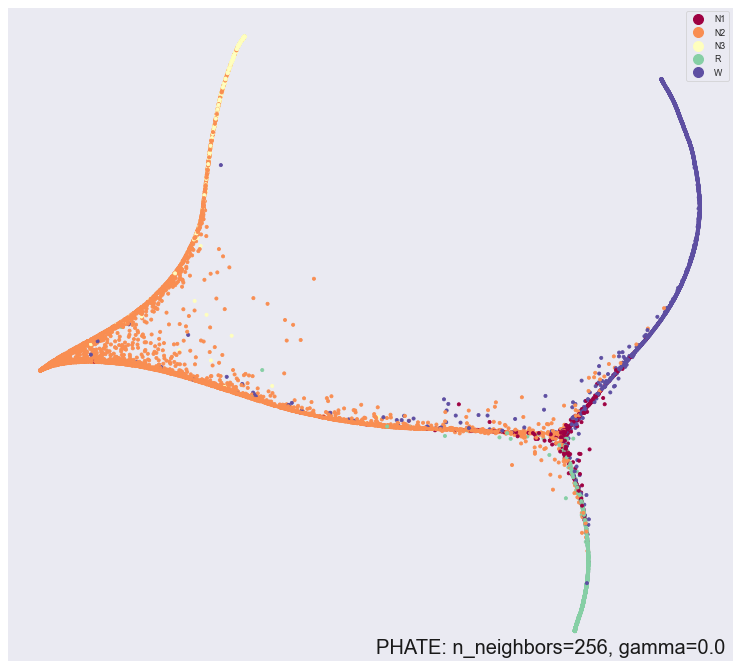

In [303]:
gammas = [0.0]
# n_knn = [128, 256, 512]
# n_knn = [2048, 4096]
n_knn = [256]
phate_ops = {k: {v: [] for v in gammas} for k in n_knn}
# f, axes = plt.subplots(nrows=len(n_knn), ncols=len(gammas), dpi=300)
for (i, j), (nn, g) in zip(
    itertools.product(range(len(n_knn)), range(len(gammas))), 
    itertools.product(n_knn, gammas)
):
    logging.info(f'knn={nn}, gamma={g}')
    logging.info('\tCreating PHATE object')
    phate_ops[nn][g] = phate.PHATE(n_components=2, n_jobs=-1, random_state=1337, knn=nn, gamma=g)
    X_phate = phate_ops[nn][g].fit_transform(X_30s)
    
    logging.info('\tPlotting embedded data')
#     ax = axes
    ax = scprep.plot.scatter2d(
        X_phate, 
        c=l_30s,
        cmap='Spectral', 
        ticks=False, 
        label_prefix='PHATE',
        dpi=300,
        s=10,
        fontsize=20
    )
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.text(
            0.99,
            0.01,
            "PHATE: n_neighbors={}, gamma={}".format(
                nn, g
            ),
            transform=ax.transAxes,
            horizontalalignment="right",
            color='k',
            fontsize=20,
    )
    
#     logging.info('\tSaving figure')
# data['PHATE1'] = X_phate[:, 0]
# data['PHATE2'] = X_phate[:, 1]
#     try:
#         save_path = f'results/phate/phate_knn{nn}_gamma{g}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
#     except:
#         save_path = f'results/phate_knn{nn}_gamma{g}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
#     break
#     umap_op = umap.UMAP(n_neighbors=nn, n_components=2, min_dist=d)
#     logging.info('\tFitting UMAP to data')
#     umap_ops[nn][d] = umap_op.fit(X)
#     logging.info('\tPlotting embedded data')
#     umap.plot.points(umap_op, labels=l, color_key_cmap='Paired', background='black')
#     logging.info('\tSaving figure')
#     try:
#         save_path = f'results/umap/umap_knn{nn}_mindist{d}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)
#     except:
#         save_path = f'results/umap_knn{nn}_mindist{d}.png'
#         plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0)

In [ ]:
import plotly.express as px

phate_ops[nn][g].set_params(n_components=3)
Y_phate_3d = phate_ops[nn][g].transform()

data['PHATE1'] = Y_phate_3d[:, 0]
data['PHATE2'] = Y_phate_3d[:, 1]
data['PHATE3'] = Y_phate_3d[:, 2]
# data['Stage'] = l_30s

fig = px.scatter_3d(
    data, x='PHATE1', y="PHATE2", z="PHATE3",
    color='Stage', hover_data=['FileID', 'Epoch nr'],
    width=1600,
    height=1600,
#     size=5*np.ones(len(Y_phate_3d[:, 0])),
)
fig.write_html("results/phate_3d_controls.html")
fig.show()

05:27:25 INFO | 	Saving figure


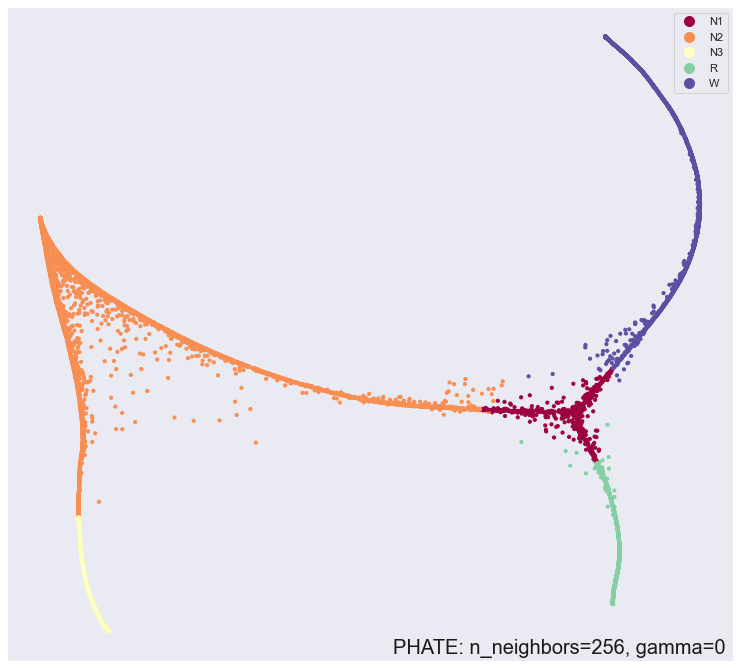

In [114]:
ax = scprep.plot.scatter2d(
    X_phate, 
    c=p_30s,
    cmap='Spectral', 
    ticks=False, 
    label_prefix='PHATE',
    dpi=300,
    s=10,
    fontsize=20
)

ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
ax.text(
        0.99,
        0.01,
        "PHATE: n_neighbors={}, gamma={}".format(
            nn, g
        ),
        transform=ax.transAxes,
        horizontalalignment="right",
        color='k',
        fontsize=20,
)
logging.info('\tSaving figure')

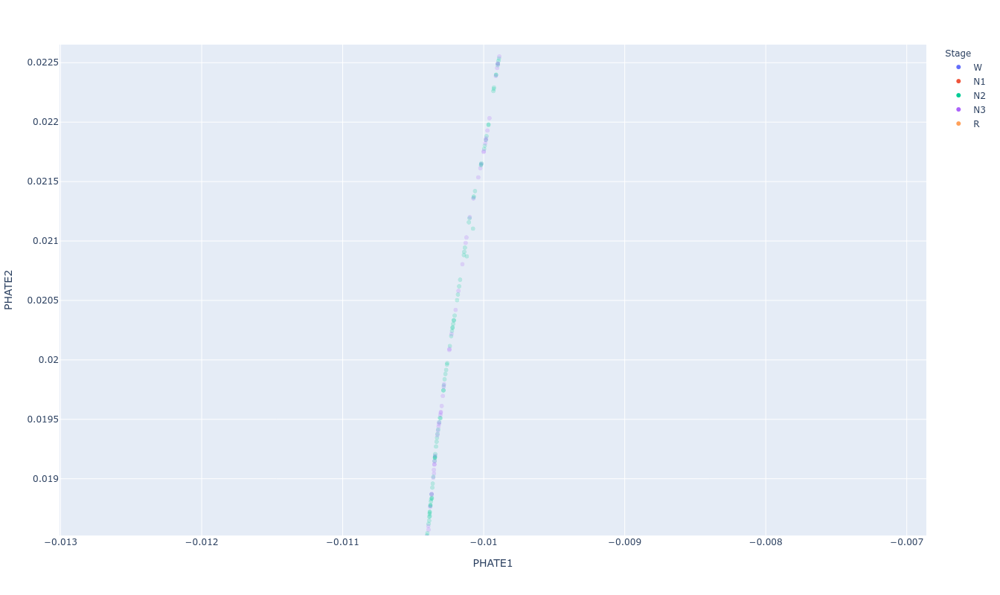

In [369]:
import plotly.express as px

fig = px.scatter(
    data, x='PHATE1', y="PHATE2",
    color='Stage', hover_data=['FileID', 'Index_30s', 'Index_5min'],
    width=800,
    height=800,
)
fig.show()

In [ ]:
# Load a specific subject.
hover_data = [
    ('C1146_4 182423.h5', 23, 231, 'N3 misclassified as N2. not visibly distinct from surrounding epochs'),
    ('A1558_4 172739.h5', 74, 742, 'corner point, N2'),
    ('SSC_5547_1.h5', 88, 888, 'Also corner point, N2'),
    ('C9188_4 135030.h5', 14, 149, 'Corner N3'),
#     ('A1558_4 172739.h5', 9, 99, ''),    # 
#     ('A1558_4 172739.h5', 59, 594, ''),  # 
    ('A0147_6 165655.h5', 75, 753, 'Upper arm, N2'),
    ('A1558_4 172739.h5', 40, 400, 'N3 misclassified as N2'),
    ('C1584_3 172654.h5', 51, 513, 'R misclassified as N2'),
    ('N4499_2 092211.h5', 13, 130, 'N3 in N2/N3 mix'),
    ('N4499_2 092211.h5', 7, 77, 'N2 in N2/N3 mix'),
    ('SSC_5547_1.h5', 17, 176, 'N2 in N2/N3 mix'),
    ('A1558_4 172739.h5', 44, 444, 'Pure N2'),
    ('C1584_3 172654.h5', 72, 729, 'W misclassifed as N2'),
    ('C1146_4 182423.h5', 85, 854, '"Pure" N2'),
    ('SSC_5547_1.h5', 71, 715, 'N1 misclassifed as N2'),
    ('N4499_2 092211.h5', 55, 550, 'Lower arm, N2'),
    ('C9188_4 135030.h5', 81, 812, 'Lower arm, N2'),
    ('SSC_5547_1.h5', 69, 697, 'Lower arm, N2'),
    ('SSC_5547_1.h5', 51, 514, 'Lower arm, N2'),
    ('N4499_2 092211.h5', 20, 203, 'Upper arm, N2'),
    ('A1558_4 172739.h5', 58, 582, 'Upper arm, N2'),
    ('A0147_6 165655.h5', 75, 753, 'Upper arm, N2'),
    ('A0147_6 165655.h5', 14, 149, 'Upper arm N2, N2/N3 mix'),
]

from utils import plot_psg_hypnogram_hypnodensity, extended_epoch_view

for FileID, seq_nr_5min, epoch_nr_30s, info in hover_data:
    print(f'{FileID} | {seq_nr_5min} | {epoch_nr_30s}')
#     title = f'5 min seq: {seq_nr_5min} | Epoch: {epoch_nr_30s} | {info}'
    title = f'Epoch: {epoch_nr_30s} | {info}'
#     plot_psg_hypnogram_hypnodensity(
    extended_epoch_view(
        FileID, 
        predictions[FileID], 
#         seq_nr=seq_nr_5min, 
        seq_nr=epoch_nr_30s,
#         seq_nr=231,
        interval=0.5,
#         interval=5,
        title=title, 
        verbose=False,
        save_path=f'exthypnogram_{FileID[:3]}_seqnr{seq_nr_5min:04d}_centraloccipitalpower.png'
    )
    plt.show()
    break

(101, 5, 38400)
C9188_4 135030.h5


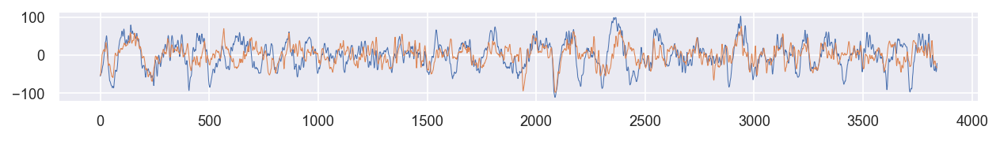

In [40]:
# FileID = 'N4499_2 092211.h5'
FileID = 'C9188_4 135030.h5'
with File(f'./data/ssc_wsc/raw/5min/test/{FileID}', 'r') as f:
    x = f['M'][:]  # (N, K, T)
print(x.shape)
print(FileID)
fig, ax = plt.subplots(figsize=(10, 1), dpi=150)
plt.plot(x[14, :2, 9*30*128:].T, linewidth=0.5)

FileID = 'N4499_2 092211.h5'
# FileID = 'C9188_4 135030.h5'
with File(f'./data/ssc_wsc/raw/5min/test/{FileID}', 'r') as f:
    x = f['M'][:]  # (N, K, T)
print(x.shape)
print(FileID)
fig, ax = plt.subplots(figsize=(10, 1), dpi=150)
plt.plot(x[13, :2, 9*30*128:].T, linewidth=0.5)

# DBSCAN clustering

Estimated number of clusters: 3
Estimated number of noise points: 267
Homogeneity: 0.586
Completeness: 0.720
V-measure: 0.646
Adjusted Rand Index: 0.650
Adjusted Mutual Information: 0.646
Silhouette Coefficient: 0.282


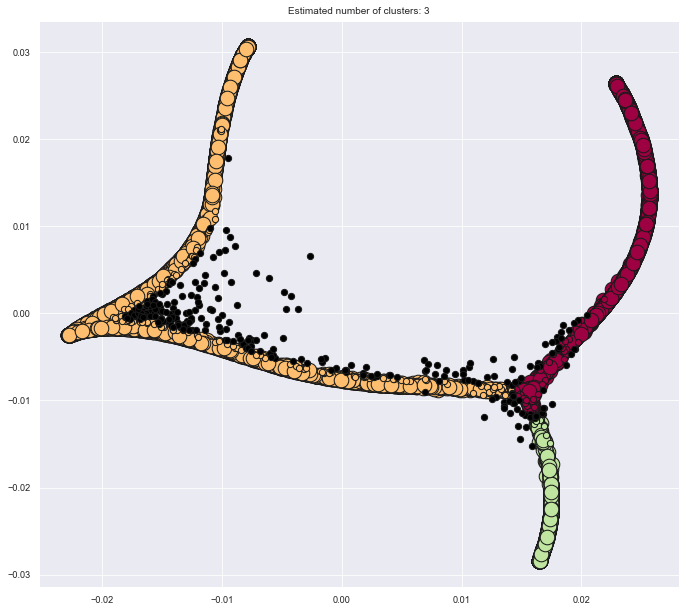

In [53]:
from sklearn.cluster import DBSCAN
from sklearn import metrics

X__ = data[['PHATE1', 'PHATE2']].to_numpy()
labels_true = data['Stage'].to_list()
labels_true = [0 if l == 'W' else l for l in labels_true]
labels_true = [1 if l == 'N1' else l for l in labels_true]
labels_true = [2 if l == 'N2' else l for l in labels_true]
labels_true = [3 if l == 'N3' else l for l in labels_true]
labels_true = [4 if l == 'R' else l for l in labels_true]


db = DBSCAN(eps=0.0005, min_samples=20).fit(X__)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
print("Adjusted Rand Index: %0.3f" % metrics.adjusted_rand_score(labels_true, labels))
print("Adjusted Mutual Information: %0.3f" % metrics.adjusted_mutual_info_score(labels_true, labels))
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X__, labels))

# #############################################################################
# Plot result
import matplotlib.pyplot as plt

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
fig = plt.figure(dpi=75)
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X__[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14)

    xy = X__[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=6)
    

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()


## Frequency analysis

  0%|          | 0/651 [00:00<?, ?it/s]

  0%|          | 0/1623 [00:00<?, ?it/s]

  0%|          | 0/689 [00:00<?, ?it/s]

  0%|          | 0/394 [00:00<?, ?it/s]

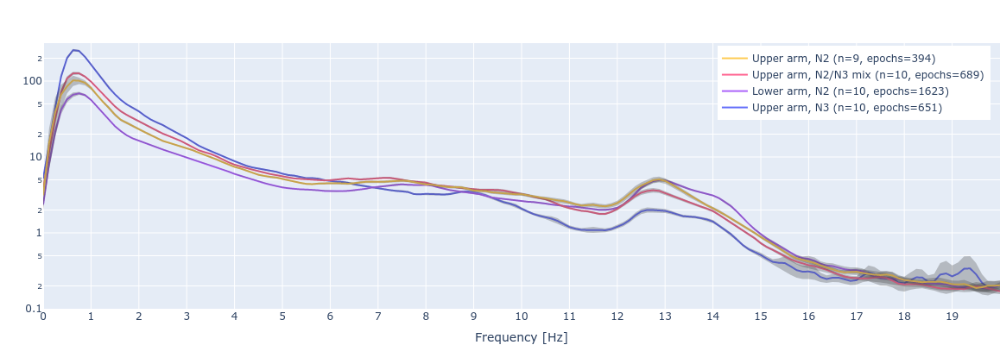

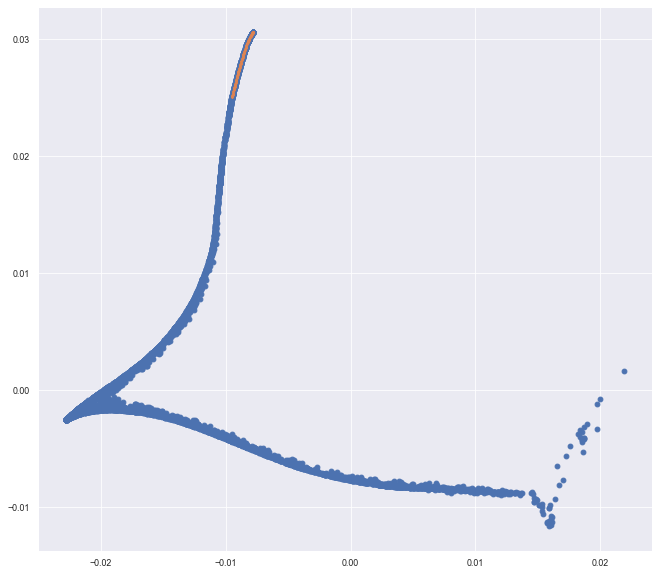

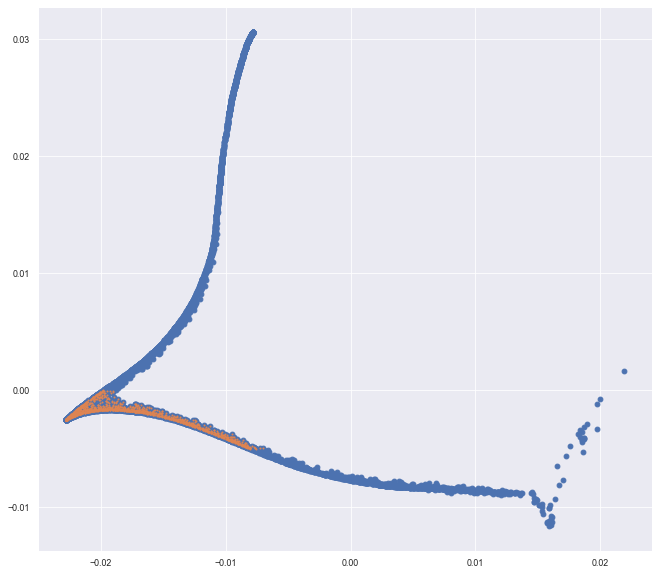

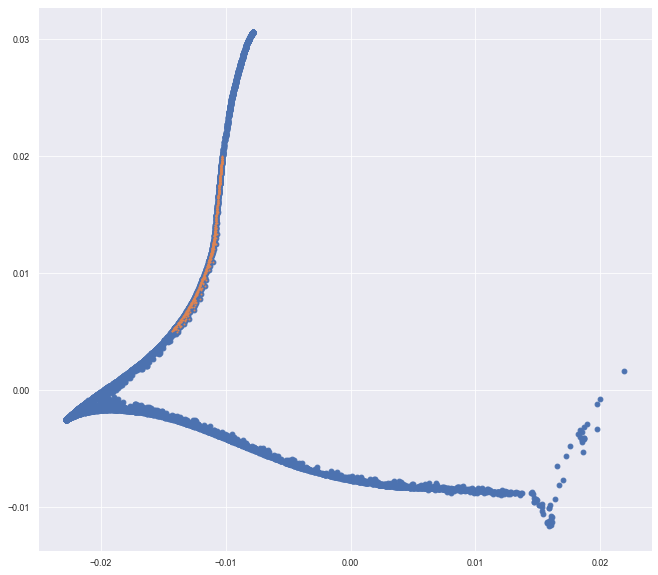

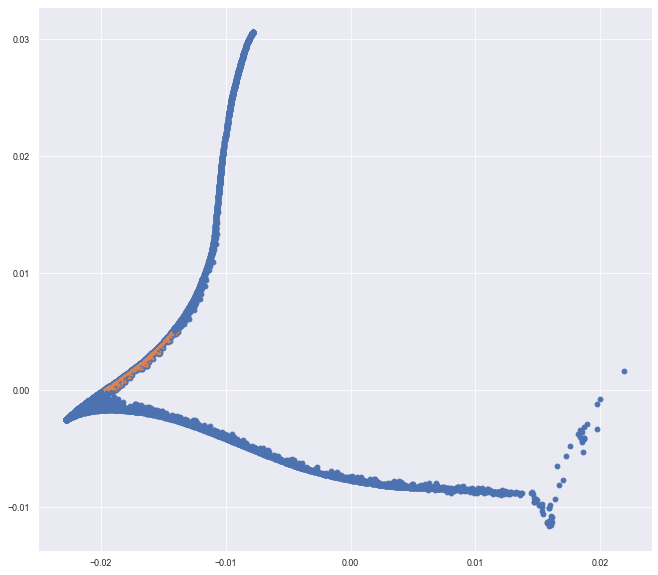

In [56]:
def plot_frequencies(freqs, Cxy, title, save_path, fig=None):
    import plotly.graph_objs as go

    freq_mask = (freqs <= 20)
    N = Cxy.shape[1]
    
    scatters = [
        go.Scatter(
#             name='Cxy_average',
            name=title,
            x=freqs[freq_mask],
            y=Cxy.mean(axis=1)[freq_mask],
            mode='lines',
#             line=dict(color='rgb(31, 119, 180)'),
            showlegend=True
        ),
        go.Scatter(
    #         name='Upper Bound',
            x=freqs[freq_mask],
#             y=Cxy.mean(axis=1)[freq_mask] + (1.96 * Cxy.std(axis=1)[freq_mask] / np.sqrt(N)),
            y=Cxy.mean(axis=1)[freq_mask] + Cxy.std(axis=1)[freq_mask] / np.sqrt(N),
#             y=Cxy.mean(axis=1)[freq_mask] + Cxy.std(axis=1)[freq_mask],
            mode='lines',
            marker=dict(color="#444"),
            line=dict(width=0),
            showlegend=False,
            hoverinfo='skip',
        ),
        go.Scatter(
    #         name='Lower Bound',
            x=freqs[freq_mask],
#             y=Cxy.mean(axis=1)[freq_mask] - (1.96 * Cxy.std(axis=1)[freq_mask] / np.sqrt(N)),
            y=Cxy.mean(axis=1)[freq_mask] - Cxy.std(axis=1)[freq_mask] / np.sqrt(N),
#             y=Cxy.mean(axis=1)[freq_mask] - Cxy.std(axis=1)[freq_mask],
            marker=dict(color="#444"),
            line=dict(width=0),
            mode='lines',
            fillcolor='rgba(68, 68, 68, 0.3)',
            fill='tonexty',
            showlegend=False,
            hoverinfo='skip',
        )
    ]
    
    if fig:
        [fig.add_trace(scatter) for scatter in scatters]
    else:
        fig = go.Figure(scatters)

    fig = go.Figure(fig.update_layout(
        yaxis_title=r'$\text{Cross-spectral density }[\mu V^2/Hz]$',
        xaxis_title='Frequency [Hz]',
        xaxis_tickvals=np.arange(20),
#         xaxis_type='log',
        yaxis_type='log',
        yaxis_range=[-1, 2.5],
#         title=f'Upper N2, (n={len(data[fid_mask]["FileID"].unique())}, n_epochs={np.sum(fid_mask)})',
#         title=title,
        hovermode="x",
        width=1200,
        height=400,
        margin=dict(b=0, l=0, r=0, t=50),
        legend=dict(
            yanchor="top",
            y=0.99,
            xanchor="right",
            x=0.99
        ),
    ))
    return fig
#     fig.write_html('results/frequency_upperN2.html')

    # fig = px.line(x=freqs[mask], y=np.abs(Cxy[mask]))
    # fig.show()
    
def coherence(X):
    import scipy.signal
    import plotly.express as px

    fs = 128
    N_seconds = 5
    N = N_seconds * fs
    noverlap = (N_seconds - 1) * fs
    nfft = 2 ** np.ceil(np.log2(N))
    _freqs, _Cxy_ = scipy.signal.csd(X[:, 0], X[:, 1], fs=fs, nperseg=N, noverlap=noverlap, nfft=nfft)

    return _freqs, _Cxy_

class_labels = (labels == 1 & core_samples_mask)

fid_masks = [
    (class_labels & (X__[:, 1] > 0.025) & (X__[:, 0] < 0.0), 'Upper arm, N3', 'frequency_upperN3.html'),
    (class_labels & (X__[:, 1] < 0.0) & (X__[:, 1] > -0.005) & (X__[:, 0] < 0.0), 'Lower arm, N2', 'frequency_lowerN2.html'),
    (class_labels & (X__[:, 1] < 0.020) & (X__[:, 1] > 0.005) & (X__[:, 0] < 0.0), 'Upper arm, N2/N3 mix', 'frequency_N2N3mix.html'),
    (class_labels & (X__[:, 1] < 0.005) & (X__[:, 1] > 0.0) & (X__[:, 0] < 0.0), 'Upper arm, N2', 'frequency_upperN2.html'),
]
# fid_mask = class_labels & (X__[:, 1] > 0.025)  # Upper N3
# fid_mask = class_labels & (X__[:, 1] < 0.0) & (X__[:, 1] > -0.005)  # Lower N2
# fid_mask = class_labels & (X__[:, 1] < 0.020) & (X__[:, 1] > 0.005)  # N2/N3 mix
# fid_mask = class_labels & (X__[:, 1] < 0.005) & (X__[:, 1] > 0.0)  # N2/N3 mix


fig = None
for fid_mask, t, s in fid_masks:
    plt.figure()
    plt.plot(X__[class_labels, 0], X__[class_labels, 1], 'o')
    plt.plot(X__[fid_mask, 0], X__[fid_mask, 1], 'o', markersize=1)
#     data[fid_mask]

    Cxy = []
    for idx, (_, row) in tqdm(enumerate(data[fid_mask].iterrows()), total=len(data[fid_mask])):

        # load subject
        subj = row['FileID']
        k_5min = row['Index_5min']
        k_30s = row['Index_30s']
        with File(f'data/ssc_wsc/raw/5min/test/{subj}', 'r') as f:
            x = (f['M'][k_5min].reshape(5, -1, 30 * 128)
                               .transpose(1, 2, 0))[k_30s - k_5min*10]

            freqs, cxy = coherence(x)
            Cxy.append(np.abs(cxy))

    Cxy = np.stack(Cxy).T
#     print(Cxy.shape)
    
    title = t + f' (n={len(data[fid_mask]["FileID"].unique())}, epochs={np.sum(fid_mask)})'
    save_path = 'results/' + s
    fig = plot_frequencies(freqs, Cxy, title, save_path, fig=fig)
    
# fig.write_html('results/frequency_plot.html', include_mathjax='cdn')
fig.show()

# OPTICS clustering

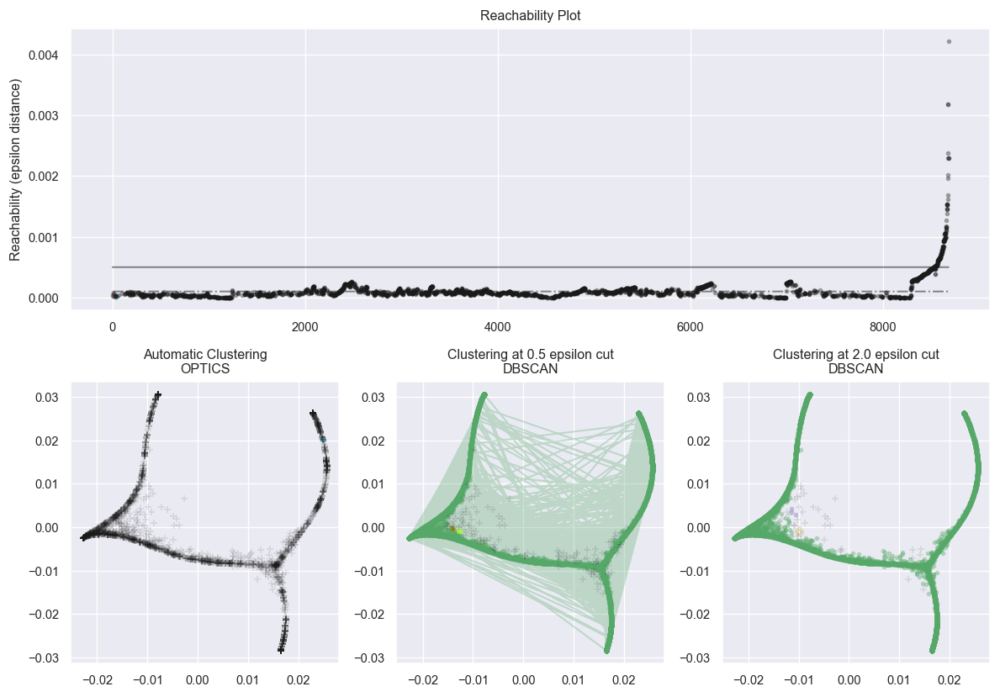

In [166]:
from sklearn.cluster import OPTICS, cluster_optics_dbscan
import matplotlib.gridspec as gridspec

np.random.seed(0)
X__ = data[['PHATE1', 'PHATE2']].to_numpy()
labels_true = data['Stage'].to_list()
labels_true = [0 if l == 'W' else l for l in labels_true]
labels_true = [1 if l == 'N1' else l for l in labels_true]
labels_true = [2 if l == 'N2' else l for l in labels_true]
labels_true = [3 if l == 'N3' else l for l in labels_true]
labels_true = [4 if l == 'R' else l for l in labels_true]

# Run the fit
clust = OPTICS(min_samples=5, xi=.00005, min_cluster_size=None)
clust.fit(X__)

labels_050 = cluster_optics_dbscan(reachability=clust.reachability_,
                                   core_distances=clust.core_distances_,
                                   ordering=clust.ordering_, eps=0.0005)
labels_200 = cluster_optics_dbscan(reachability=clust.reachability_,
                                   core_distances=clust.core_distances_,
                                   ordering=clust.ordering_, eps=0.001)

space = np.arange(len(X__))
reachability = clust.reachability_[clust.ordering_]
labels = clust.labels_[clust.ordering_]

plt.figure(figsize=(10, 7), dpi=120)
G = gridspec.GridSpec(2, 3)
ax1 = plt.subplot(G[0, :])
ax2 = plt.subplot(G[1, 0])
ax3 = plt.subplot(G[1, 1])
ax4 = plt.subplot(G[1, 2])

# Reachability plot
colors = ['g.', 'r.', 'b.', 'y.', 'c.']
for klass, color in zip(range(0, 5), colors):
    Xk = space[labels == klass]
    Rk = reachability[labels == klass]
    ax1.plot(Xk, Rk, color, alpha=0.3)
ax1.plot(space[labels == -1], reachability[labels == -1], 'k.', alpha=0.3)
ax1.plot(space, np.full_like(space, 0.0005, dtype=float), 'k-', alpha=0.5)
ax1.plot(space, np.full_like(space, 0.0001, dtype=float), 'k-.', alpha=0.5)
ax1.set_ylabel('Reachability (epsilon distance)')
ax1.set_title('Reachability Plot')

# OPTICS
colors = ['g.', 'r.', 'b.', 'y.', 'c.']
for klass, color in zip(range(0, 5), colors):
    Xk = X__[clust.labels_ == klass]
    ax2.plot(Xk[:, 0], Xk[:, 1], color, alpha=0.3)
ax2.plot(X__[clust.labels_ == -1, 0], X__[clust.labels_ == -1, 1], 'k+', alpha=0.1)
ax2.set_title('Automatic Clustering\nOPTICS')

# DBSCAN at 0.5
colors = ['g', 'greenyellow', 'olive', 'r', 'b', 'c']
for klass, color in zip(range(0, 6), colors):
    Xk = X__[labels_050 == klass]
    ax3.plot(Xk[:, 0], Xk[:, 1], color, alpha=0.3, marker='.')
ax3.plot(X__[labels_050 == -1, 0], X__[labels_050 == -1, 1], 'k+', alpha=0.1)
ax3.set_title('Clustering at 0.5 epsilon cut\nDBSCAN')

# DBSCAN at 2.
colors = ['g.', 'm.', 'y.', 'c.']
for klass, color in zip(range(0, 4), colors):
    Xk = X__[labels_200 == klass]
    ax4.plot(Xk[:, 0], Xk[:, 1], color, alpha=0.3)
ax4.plot(X__[labels_200 == -1, 0], X__[labels_200 == -1, 1], 'k+', alpha=0.1)
ax4.set_title('Clustering at 2.0 epsilon cut\nDBSCAN')

plt.tight_layout()
plt.show()

# Basic KNN clustering

Calculating PHATE...
  Running PHATE on 265500 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 65.18 seconds.
    Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 1153 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 21.12 seconds.
  Calculated graph and diffusion operator in 88.89 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 151.31 seconds.
    Calculating KMeans...
    Calculated KMeans in 46.84 seconds.
  Calculated landmark operator in 204.38 seconds.
  Calculating optimal t...
    Automatically selected t = 76
  Calculated optimal t in 1.49 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.84 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.83 seconds.
Calculated PHATE in 301.45 seconds.
Clustering using 3 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 5 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 10 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 15 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 20 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 25 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


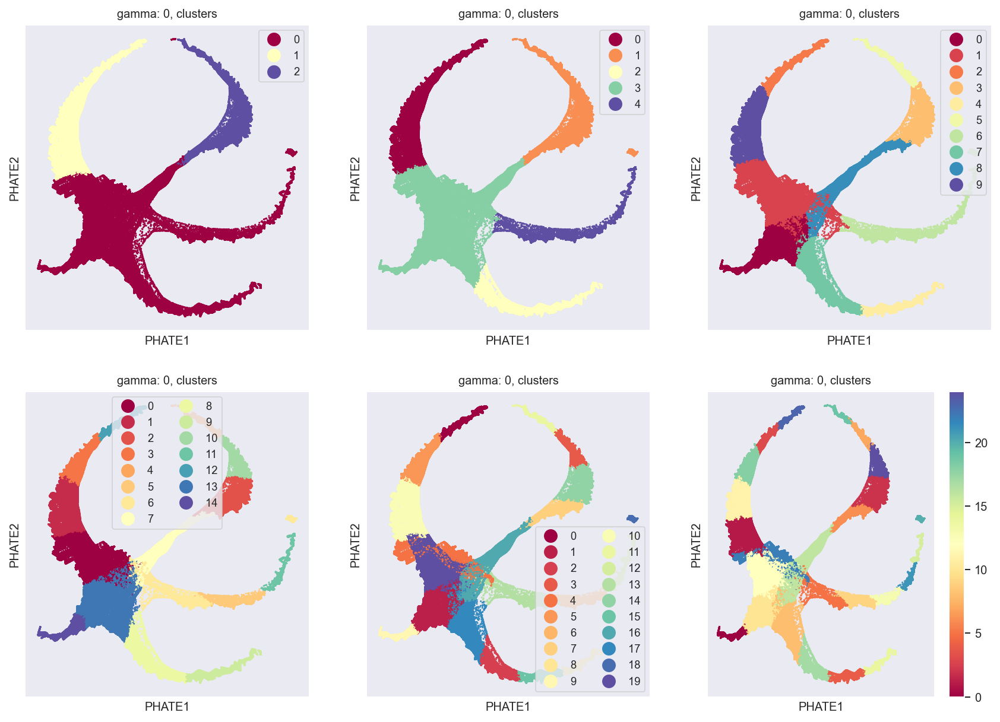

In [85]:
n_knn = 128
gamma = 0
phate_op = phate.PHATE(n_jobs=-1, random_state=1337, knn=n_knn, gamma=gamma)
y_phate = phate_op.fit_transform(X)
f, axes = plt.subplots(nrows=2, ncols=3, dpi=150)
n_clusters = [3, 5, 10, 15, 20, 25]
for i, j, nc in zip(
    (0, 0, 0, 1, 1, 1),
    (0, 1, 2, 0, 1, 2),
    n_clusters
):
#     if nc == 5:
    print(f'Clustering using {nc} clusters')
    cluster_assignments = phate.cluster.kmeans(phate_op, n_clusters=nc, max_clusters=30, random_state=1337, n_jobs=-1)
#         title=f'gamma: {gamma}, sleep stages'
#         scprep.plot.scatter2d(
#             y_phate, 
#             c=l,
#             cmap='Spectral', 
#             ticks=False, 
#             label_prefix='PHATE', 
#             ax=axes[0],
#             title=title
#         )
    title=f'gamma: {gamma}, clusters'
    scprep.plot.scatter2d(
        y_phate, 
        c=cluster_assignments,
        cmap='Spectral', 
        ticks=False, 
        label_prefix='PHATE', 
        ax=axes[i, j],
        title=title
    )

Clustering using 3 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 5 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 10 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 15 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 20 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


Clustering using 25 clusters


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:939: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


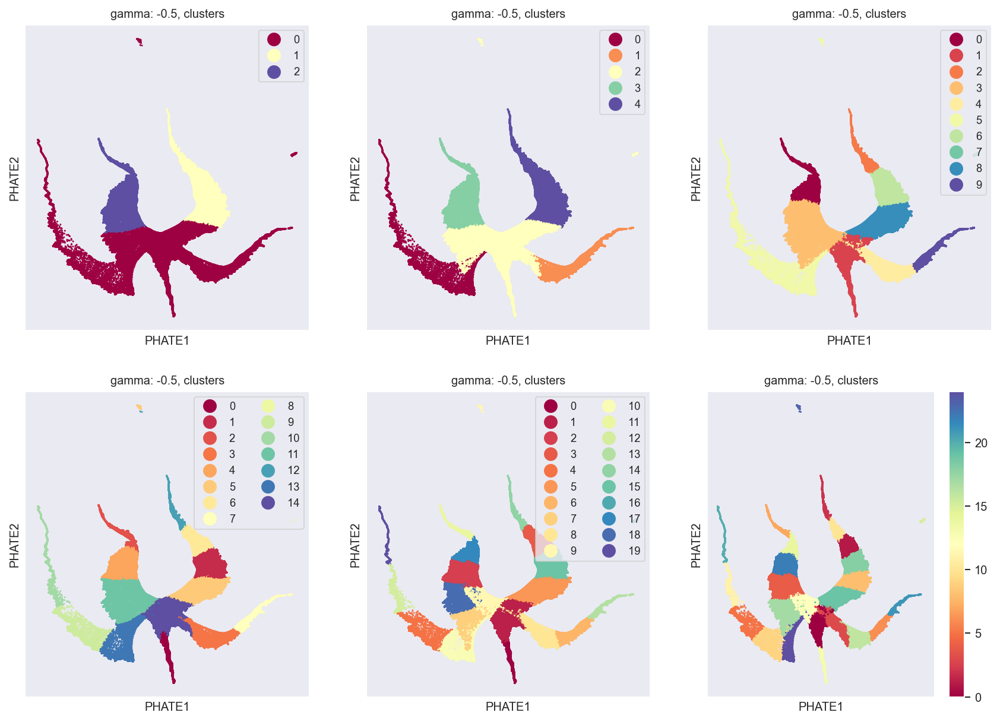

In [83]:
n_knn = 128
gamma = -0.5
# phate_op = phate.PHATE(n_jobs=-1, random_state=1337, knn=n_knn, gamma=gamma)
# y_phate = phate_op.fit_transform(X)
f, axes = plt.subplots(nrows=2, ncols=3, dpi=150)
n_clusters = [3, 5, 10, 15, 20, 25]
for i, j, nc in zip(
    (0, 0, 0, 1, 1, 1),
    (0, 1, 2, 0, 1, 2),
    n_clusters
):
#     if nc == 5:
    print(f'Clustering using {nc} clusters')
    cluster_assignments = phate.cluster.kmeans(phate_op, n_clusters=nc, max_clusters=30, random_state=1337, n_jobs=-1)
#         title=f'gamma: {gamma}, sleep stages'
#         scprep.plot.scatter2d(
#             y_phate, 
#             c=l,
#             cmap='Spectral', 
#             ticks=False, 
#             label_prefix='PHATE', 
#             ax=axes[0],
#             title=title
#         )
    title=f'gamma: {gamma}, clusters'
    scprep.plot.scatter2d(
        y_phate, 
        c=cluster_assignments,
        cmap='Spectral', 
        ticks=False, 
        label_prefix='PHATE', 
        ax=axes[i, j],
        title=title
    )

In [8]:
X = []
y = []
l = []
d = []
for idx, selected_record in top10_controls.iterrows():
    fileid = selected_record['FileID']
    diagnosis = selected_record['Diagnosis'].replace("'", "")
    record = predictions[fileid]
    logits = record['logits']
    target = record['true'].argmax(axis=1).repeat(30)
    labels = np.array([HYP_DICT[t] for t in target])
    labels_disease = [diagnosis for _ in range(len(target))]
    
    X.append(logits)
    y.append(target)
    l.append(labels)
    d.extend(labels_disease)
    
X = np.concatenate(X, axis=0)
y = np.concatenate(y, axis=0)
l = np.concatenate(l, axis=0)

In [97]:
phate_op.transform(X=X_narc)

Calculating KNN search...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/phate/phate.py:881: RuntimeWarning: Pre-fit PHATE should not be used to transform a new data matrix. Please fit PHATE to the new data by running 'fit' with the new data.
  RuntimeWarning,


Calculated KNN search in 6.87 seconds.
Calculating affinities...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 123 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


Calculated affinities in 2.34 seconds.


array([[ 0.01309084,  0.01131705],
       [ 0.01349435,  0.01417757],
       [ 0.01410813,  0.01094078],
       ...,
       [-0.01325141,  0.00453331],
       [ 0.00039783, -0.01865293],
       [ 0.00860233, -0.0207269 ]])

Calculating KNN search...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/phate/phate.py:881: RuntimeWarning: Pre-fit PHATE should not be used to transform a new data matrix. Please fit PHATE to the new data by running 'fit' with the new data.
  RuntimeWarning,


Calculated KNN search in 6.21 seconds.
Calculating affinities...
Calculated affinities in 2.26 seconds.
Calculating KNN search...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/phate/phate.py:881: RuntimeWarning: Pre-fit PHATE should not be used to transform a new data matrix. Please fit PHATE to the new data by running 'fit' with the new data.
  RuntimeWarning,


Calculated KNN search in 6.75 seconds.
Calculating affinities...
Calculated affinities in 2.35 seconds.
Calculating KNN search...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/phate/phate.py:881: RuntimeWarning: Pre-fit PHATE should not be used to transform a new data matrix. Please fit PHATE to the new data by running 'fit' with the new data.
  RuntimeWarning,


Calculated KNN search in 7.20 seconds.
Calculating affinities...
Calculated affinities in 2.45 seconds.
Calculating KNN search...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/phate/phate.py:881: RuntimeWarning: Pre-fit PHATE should not be used to transform a new data matrix. Please fit PHATE to the new data by running 'fit' with the new data.
  RuntimeWarning,


Calculated KNN search in 6.89 seconds.
Calculating affinities...
Calculated affinities in 2.33 seconds.
Calculating KNN search...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/phate/phate.py:881: RuntimeWarning: Pre-fit PHATE should not be used to transform a new data matrix. Please fit PHATE to the new data by running 'fit' with the new data.
  RuntimeWarning,


Calculated KNN search in 5.02 seconds.
Calculating affinities...
Calculated affinities in 1.95 seconds.
Calculating KNN search...


/home/neergaard/miniconda3/envs/pt1.7/lib/python3.7/site-packages/phate/phate.py:881: RuntimeWarning: Pre-fit PHATE should not be used to transform a new data matrix. Please fit PHATE to the new data by running 'fit' with the new data.
  RuntimeWarning,


Calculated KNN search in 8.50 seconds.
Calculating affinities...
Calculated affinities in 2.48 seconds.


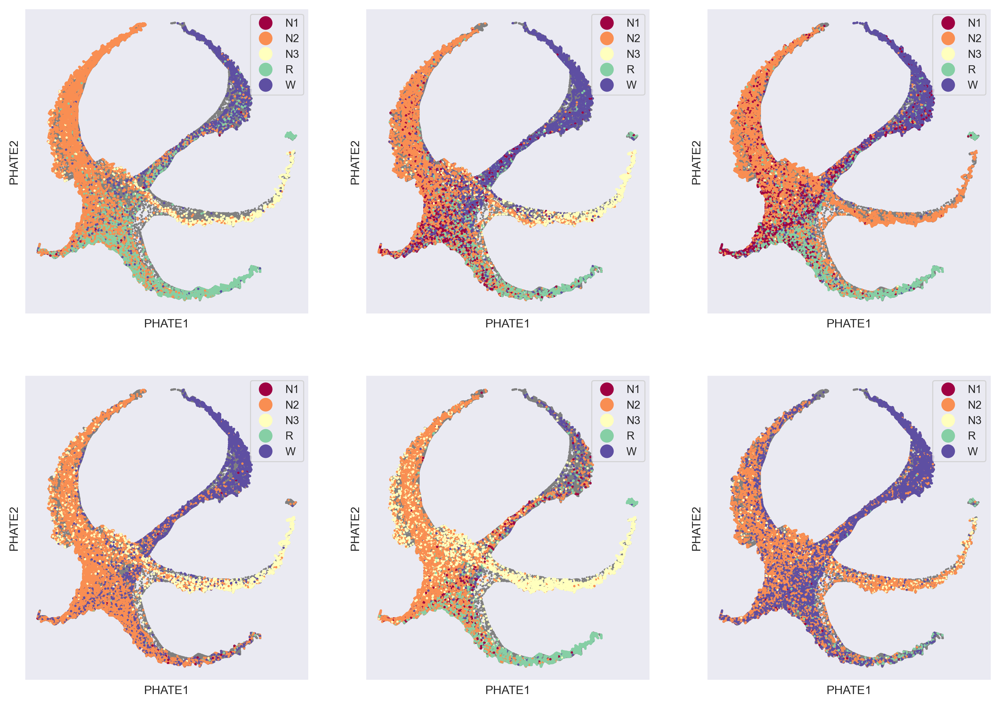

In [15]:
n_knn = 128
gamma = 0
# phate_op = phate.PHATE(n_jobs=-1, random_state=1337, knn=n_knn, gamma=gamma)
# y_phate = phate_op.fit_transform(X)
f, axes = plt.subplots(nrows=2, ncols=3, dpi=300)
for i, j, (_, row) in zip(
    (0, 0, 0, 1, 1, 1),
    (0, 1, 2, 0, 1, 2),
    narcs.iterrows()
):
    scprep.plot.scatter2d(
        y_phate, 
        c='gray',
#         c=cluster_assignments,
#         cmap='gray', 
        ticks=False, 
        label_prefix='PHATE', 
        ax=axes[i, j],
#         title=title
    )
#     print(row)fileid = row['FileID']
    subjectid = row['SubjectID']
    fileid = row['FileID']
    record = predictions[fileid]
#     diagnosis = selected_record['Diagnosis'].replace("'", "")
#     record = predictions[fileid]
    X_narc = record['logits']
    y_narc = record['true'].argmax(axis=1).repeat(30)
    l_narc = np.array([HYP_DICT[t] for t in y_narc])
    X_narc_embd = phate_op.transform(X=X_narc)
    scprep.plot.scatter2d(
        X_narc_embd, 
        c=l_narc,
#         c=cluster_assignments,
        cmap='Spectral', 
        ticks=False, 
        label_prefix='PHATE', 
        ax=axes[i, j],
#         title=title
    )
#     target = record['true'].argmax(axis=1).repeat(30)
#     labels = np.array([HYP_DICT[t] for t in target])
#     labels_disease = [diagnosis for _ in range(len(target))]
#     if nc == 5:
#     print(f'Clustering using {nc} clusters')
#     cluster_assignments = phate.cluster.kmeans(phate_op, n_clusters=nc, max_clusters=30, random_state=1337, n_jobs=-1)
#         title=f'gamma: {gamma}, sleep stages'
#         scprep.plot.scatter2d(
#             y_phate, 
#             c=l,
#             cmap='Spectral', 
#             ticks=False, 
#             label_prefix='PHATE', 
#             ax=axes[0],
#             title=title
#         )
#     title=f'gamma: {gamma}, clusters'
    plt.savefig()
    

In [6]:
selected_top10

,FileID,SubjectID,Window,Case,Accuracy,Balanced accuracy,Kappa,F1,Precision,Recall,...,Precision - N3,Recall - N3,Support - N3,F1 - REM,Precision - REM,Recall - REM,Support - REM,ID,Diagnosis,Label
0,C0046_4 173331.h5,C0046_4 173331,1 s,all,0.951432,0.644655,0.591231,0.697157,0.774501,0.644655,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,C0046_4 173331,'NON-NARCOLEPSY CONTROL',0
1,SSC_5254_1.h5,SSC_5254_1,1 s,all,0.939673,0.860957,0.850046,0.784946,0.790100,0.860957,...,0.947368,0.947368,57.0,0.000000,0.000000,0.000000,0.0,SSC_5254_1,'NON-NARCOLEPSY CONTROL',0
2,C1584_3 172654.h5,C1584_3 172654,1 s,all,0.912027,0.815213,0.865526,0.784308,0.761220,0.815213,...,0.485714,0.586207,29.0,0.896175,0.872340,0.921348,89.0,C1584_3 172654,'NON-NARCOLEPSY CONTROL',0
3,A2202_3 171828.h5,A2202_3 171828,1 s,all,0.908976,0.836763,0.793684,0.777232,0.766219,0.836763,...,0.705128,1.000000,55.0,0.805970,0.692308,0.964286,28.0,A2202_3 171828,'NON-NARCOLEPSY CONTROL',0
4,A0147_6 165655.h5,A0147_6 165655,1 s,all,0.900966,0.871082,0.842300,0.800551,0.769639,0.871082,...,0.597015,0.851064,47.0,0.938462,0.945736,0.931298,131.0,A0147_6 165655,'NON-NARCOLEPSY CONTROL',0
5,SSC_5547_1.h5,SSC_5547_1,1 s,all,0.899548,0.877883,0.848494,0.850218,0.828665,0.877883,...,0.808383,0.957447,141.0,0.951220,0.917647,0.987342,158.0,SSC_5547_1,'NON-NARCOLEPSY CONTROL',0
6,SSC_5017_1.h5,SSC_5017_1,1 s,all,0.897959,0.744431,0.724751,0.728063,0.724796,0.744431,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,SSC_5017_1,'NON-NARCOLEPSY CONTROL',0
7,N4499_2 092211.h5,N4499_2 092211,1 s,all,0.890519,0.819924,0.828192,0.785691,0.766977,0.819924,...,0.702381,0.855072,69.0,0.953930,0.926316,0.983240,179.0,N4499_2 092211,'NON-NARCOLEPSY CONTROL',0
8,A0531_6 175138.h5,A0531_6 175138,1 s,all,0.888331,0.871765,0.843528,0.832315,0.819650,0.871765,...,0.758065,0.824561,57.0,0.928910,0.980000,0.882883,111.0,A0531_6 175138,'NON-NARCOLEPSY CONTROL',0
9,C2209_4 233629.h5,C2209_4 233629,1 s,all,0.888122,0.854197,0.844454,0.833848,0.834242,0.854197,...,0.915254,0.739726,73.0,0.960396,0.960396,0.960396,101.0,C2209_4 233629,'NON-NARCOLEPSY CONTROL',0


In [ ]:
X = []
y = []
l = []
d = []
for idx, selected_record in selected_top10.iterrows():
    fileid = selected_record['FileID']
    diagnosis = selected_record['Diagnosis'].replace("'", "")
    record = predictions[fileid]
    logits = record['logidts']
    target = record['true'].argmax(axis=1).repeat(30)
    labels = np.array([HYP_DICT[t] for t in target])
    labels_disease = [diagnosis for _ in range(len(target))]
    
    X.append(logits)
    y.append(target)
    l.append(labels)
    d.extend(labels_disease)
    
X = np.concatenate(X, axis=0)
y = np.concatenate(y, axis=0)
l = np.concatenate(l, axis=0)
# X = np.asarray(X)
# y = np.array(y)
# l = np.array(l)
for n_knn in [5, 15, 25, 50, 100, 150, 200, 250]:
    phate_op = phate.PHATE(n_jobs=-1, random_state=1337, knn=n_knn)
    y_phate = phate_op.fit_transform(X)
    title = f"KNN: {n_knn}"
    scprep.plot.scatter2d(y_phate, c=d, cmap='Spectral', ticks=False, label_prefix='PHATE')
    plt.title(title)
    plt.savefig(f"results/phate/phate_narco_{fileid.split('.')[0]}_knn{n_knn:03}_disorder.png", dpi=300, bbox_inches='tight', pad_inches=0)
    scprep.plot.scatter2d(y_phate, c=l, cmap='Spectral', ticks=False, label_prefix='PHATE')
    plt.title(title)
    plt.savefig(f"results/phate/phate_narco_{fileid.split('.')[0]}_knn{n_knn:03}_stages.png", dpi=300, bbox_inches='tight', pad_inches=0)

Calculating PHATE...
  Running PHATE on 29700 observations and 5 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 2.37 seconds.
    Calculating affinities...


/home/groups/mignot/miniconda3/envs/pt1.7/lib/python3.7/site-packages/graphtools/graphs.py:293: RuntimeWarning: Detected zero distance between 516 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  RuntimeWarning,


    Calculated affinities in 0.65 seconds.
  Calculated graph and diffusion operator in 3.10 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 2.85 seconds.
    Calculating KMeans...
    Calculated KMeans in 15.80 seconds.
  Calculated landmark operator in 20.38 seconds.
  Calculating optimal t...
    Automatically selected t = 51
  Calculated optimal t in 1.43 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.61 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 5.62 seconds.
Calculated PHATE in 31.16 seconds.
Calculating metric MDS...
Calculated metric MDS in 57.42 seconds.


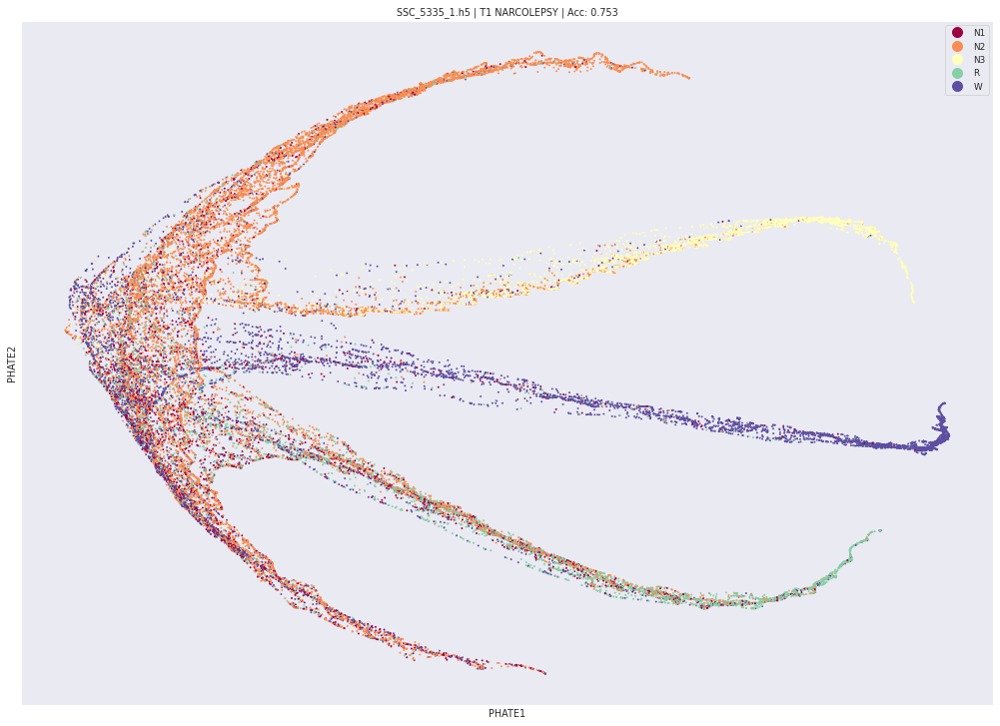

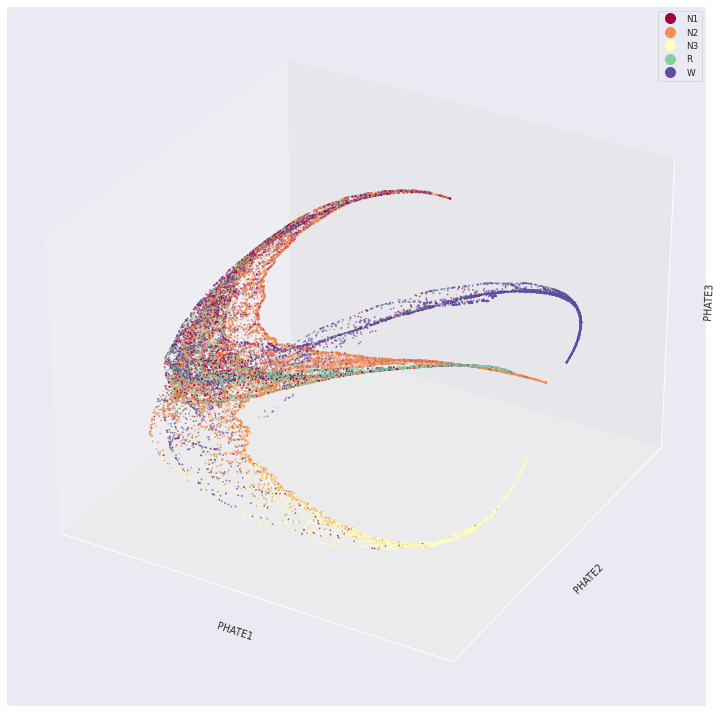

In [42]:
for idx, selected_record in df_preds.query('Label == 1').iterrows():
    fileid = selected_record['FileID']
    if fileid == 'SSC_5335_1.h5':
        pass
    else:
        continue
    diagnosis = selected_record['Diagnosis'].replace("'", "")
    acc = selected_record['Accuracy']
    record = predictions[fileid]
    logits = record['logits']
    target = record['true'].argmax(1).repeat(30)
    labels = np.array([HYP_DICT[t] for t in target])
    labels_halfhour = np.arange(len(labels) / (30 * 60)).repeat(30 * 60)[:len(labels)]
    phate_op = phate.PHATE(n_jobs=-2, random_state=1337, knn=20)
    Y_phate = phate_op.fit_transform(logits)
#     umap.plot.points(mapper, labels=labels, theme='fire')
    scprep.plot.scatter2d(Y_phate, c=labels, cmap='Spectral', ticks=False, label_prefix="PHATE")
    title = (f"{fileid} | " +
             f"{diagnosis} | " +
             f"Acc: {acc:.3f}")
    plt.title(title)
    phate_op.set_params(n_components=3)
    Y_phate_3d = phate_op.transform()
    scprep.plot.scatter3d(Y_phate_3d, c=labels, cmap='Spectral', ticks=False, label_prefix='PHATE')
#     plt.savefig(f"results/umap/narco_{fileid.split('.')[0]}.png", dpi=300, bbox_inches='tight', pad_inches=0)

In [49]:
labels_1s = np.arange(len(labels)) / (len(labels) * 8)